In [1]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, StratifiedShuffleSplit, KFold
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.svm import SVR, SVC
from sklearn.metrics import r2_score, accuracy_score, recall_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.kernel_ridge import KernelRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF,ConstantKernel as C
from matplotlib_venn import venn2
from lightgbm import LGBMRegressor
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.mixture import GaussianMixture
import json
import pickle
import xgboost as xgb

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from hyperopt.pyll.base import scope
from hyperopt.pyll.stochastic import sample

import numpy as np
import pandas as pd
from scipy import stats
import copy

import seaborn as sns
from IPython.display import set_matplotlib_formats
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.patches as mpatches

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
set_matplotlib_formats('retina')
plt.rcParams['figure.dpi'] = 250
plt.rcParams.update({'font.size': 5})
sns.set_style('dark', {'legend.frameon':True})
np.random.seed(42)

# 1. Helper functions

In [3]:
def plot_pred(s_pred, y_val2, term, mse):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(6,4.5))

    sns.scatterplot(y = np.expm1(s_pred), x = np.expm1(y_val2), ax=ax1)
    g = sns.lineplot(x = [0,100], y = [0,100], color = 'red', ax = ax1)
    g.lines[0].set_linestyle(':')
    ax1.set_title('Lab Measurement and Predictions of %s'%term)
    ax1.set_xlabel('Lab Measurement, C6plus, wt%')
    ax1.set_ylabel('Predictions, C6plus, wt%')
    ax1.grid()

    std_list = [1, 3, 5]
    cols = ['green', 'orange', 'red']
    errors = np.expm1(y_val2) - np.expm1(s_pred)

    sns.barplot(x = list(range(len(s_pred))), y = errors, linewidth = 0, color = 'black', ax=ax2)
    for i in range(len(std_list)):
        ax2.hlines(y = std_list[i], xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5)
        ax2.hlines(y = -std_list[i], xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5, label='%d%%'%std_list[i])
    _step = 50
    ticks = np.concatenate((np.arange(1, _step, _step-1), np.arange(_step, len(s_pred), _step)))
    ax2.set_xticks(ticks-1)
    ax2.set_xticklabels(ticks)
    ax2.set_title('Difference between Lab Measurement and Predictions of %s'%term)
    ax2.set_xlabel('Data points')
    ax2.set_ylabel('Lab C6plus - Predictioin, wt%')
    ax2.legend()
    ax2.grid()

    stat_list = [sum(np.abs(errors) <= i) for i in range(1, 6)]
    stat_list.extend([sum(np.abs(errors) <= 10), sum(np.abs(errors) <= 15), sum(np.abs(errors) <= 20), sum(np.abs(errors) > 20)])
    xlabels = ['<= %s%%'%str(i+1) for i in range(5)]
    xlabels.extend(['<= 10%', '<= 15%', '<= 20%', '> 20%'])
    g = sns.barplot(x = list(range(len(stat_list))), y = stat_list, ax = ax3, palette = sns.color_palette('Oranges_d', len(stat_list))[::-1])
    for p in g.patches:
        g.annotate("%d\n%d%%" % (int(p.get_height()), int(p.get_height())*100/len(errors)), (p.get_x() + p.get_width() / 2., p.get_height()*0.2), ha='center', va='center', weight = 'bold', xytext=(0, 20), textcoords='offset points')
    ax3.set_ylabel('Frequency')
    ax3.set_xlabel('Errors')
    ax3.set_xticklabels(xlabels)
    ticks2 = np.arange(0, len(errors), 50)
    ax3.tick_params(axis='both', which='both', length=0)
    ax3.set_title('Summary of Errors, MSE = %.4f'%mse)
    ax3.grid()

    sns.scatterplot(y = np.expm1(y_val2) - np.expm1(s_pred), x = np.expm1(y_val2), ax=ax4)
    g = sns.lineplot(x = [min(np.expm1(y_val2)),max(np.expm1(y_val2))], y = [0,0], color = 'red', ax = ax4)
    g.lines[0].set_linestyle(':')
    ax4.set_title('C6+ and Errors')
    ax4.set_ylabel('Errors, Lab Measurement - Prediction')
    ax4.set_xlabel('Lab Measurement, C6+')
    ax4.grid()

    plt.tight_layout()
    plt.show()

def plot_pred2(s_pred, y_val2, term, mse):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(6,4.5))

    sns.scatterplot(y = np.expm1(s_pred), x = np.expm1(y_val2), ax=ax1)
    g = sns.lineplot(x = [0,10000], y = [0,10000], color = 'red', ax = ax1)
    g.lines[0].set_linestyle(':')
    ax1.set_title('Lab Measurement and Predictions of %s'%term)
    ax1.set_xlabel('Lab Measurement, GOR')
    ax1.set_ylabel('Predictions, GOR')
    ax1.grid()

    std_list = [1, 3, 5]
    cols = ['green', 'orange', 'red']
    errors = np.expm1(y_val2) - np.expm1(s_pred)

    sns.barplot(x = list(range(len(s_pred))), y = errors, linewidth = 0, color = 'black', ax=ax2)
    for i in range(len(std_list)):
        ax2.hlines(y = std_list[i]*100, xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5)
        ax2.hlines(y = -std_list[i]*100, xmin = 0, xmax = len(s_pred), linestyles= '--', colors=cols[i], linewidth = 0.5, label='%d'%(std_list[i]*100))
    _step = 100
    ticks = np.concatenate((np.arange(1, _step, _step-1), np.arange(_step, len(s_pred), _step)))
    ax2.set_xticks(ticks-1)
    ax2.set_xticklabels(ticks)
    ax2.set_title('Difference between Lab Measurement and Predictions of %s'%term)
    ax2.set_xlabel('Data points')
    ax2.set_ylabel('Lab GOR - Predictioin')
    ax2.legend()
    ax2.grid()
    
    mul = 100
    step_list = [1,2,3,4,5,10,15,20,20]
    stat_list = [sum(np.abs(errors) <= i*mul) for i in step_list[:-1]]
    stat_list.append(sum(np.abs(errors) > step_list[-1]*mul))
#     xlabels = ['<= %sE3'%str(i+1) for i in range(5)]
#     xlabels.extend(['<= 1E4', '<= 1.5E4', '<= 2E4', '> 2E4'])
    xlabels = ['<= '+str(i*mul) for i in step_list[:-1]]
    xlabels.append('> '+str(step_list[-1]*mul))
    g = sns.barplot(x = list(range(len(stat_list))), y = stat_list, ax = ax3, palette = sns.color_palette('Oranges_d', len(stat_list))[::-1])
    for p in g.patches:
        g.annotate("%d\n%d%%" % (int(p.get_height()), int(p.get_height())*100/len(errors)), (p.get_x() + p.get_width() / 2., p.get_height()*0.2), ha='center', va='center', weight = 'bold', xytext=(0, 20), textcoords='offset points')
    ax3.set_ylabel('Frequency')
    ax3.set_xlabel('Errors, Lab Measurement - Prediction')
    ax3.set_xticklabels(xlabels)
#     ax4 = ax3.twinx()
    ticks2 = np.arange(0, len(errors), 50)
#     ax3.set_yticks(np.linspace(0, 300, 6))
    ax3.tick_params(axis='both', which='both', length=0)
    ax3.set_title('Summary of Errors, MSE = %.4f'%mse)
    ax3.grid()
    
    sns.scatterplot(y = np.expm1(y_val2) - np.expm1(s_pred), x = np.expm1(y_val2), ax=ax4)
    g = sns.lineplot(x = [min(np.expm1(y_val2)),max(np.expm1(y_val2))], y = [0,0], color = 'red', ax = ax4)
    g.lines[0].set_linestyle(':')
    ax4.set_title('GOR and Errors')
    ax4.set_ylabel('Errors, Lab Measurement - Prediction')
    ax4.set_xlabel('Lab Measurement, GOR')
    ax4.grid()

    plt.tight_layout()
    plt.show()
    
def plot_trials(trials):
    l = (np.array([i['result']['loss'] for i in trials])**2).tolist()
    l2 = (np.array([i['result']['test'] for i in trials])**2).tolist()
    sns.lineplot(x = list(range(len(l))), y = l, label = 'Training Error')#, linewidth = 0.1)
    sns.lineplot(x = list(range(len(l))), y = l2, label = 'Test Error')#, linewidth = 0.1)
    plt.plot([l.index(min(l)), l.index(min(l))], [min(l2), max(l)], color = 'green', ls= '--', label = 'Minimum Training')
    plt.plot([l2.index(min(l2)), l2.index(min(l2))], [min(l2), max(l)], color = 'black', ls= '--', label = 'Minimum Test')
    plt.xlabel('Iterations of Optimization', fontsize = 15)
    plt.ylabel('Mean Squared Error', fontsize = 15)
    plt.title('Training and Test Error of Bayesian Optimization', fontsize = 15)
    plt.grid()
    plt.legend()
def plot_min_dist(n_trials):
    d = [min([i['result']['test'] for i in trials[1]]) for trials in n_trials]
    sns.distplot(d)
    return d

# Featear engineering functions
def feat_eng(total_x):
    total_x = total_x.div(total_x.sum(axis = 1), axis = 0)*100
    total_x['Wh'] = total_x[['C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']].sum(axis = 1)*100 / total_x[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']].sum(axis = 1)
    total_x['Bh'] = (total_x['C1_mol'] + total_x['C2_mol']) / (total_x['C3_mol'] + total_x['C4_mol'] + total_x['C5_mol'])
    total_x['Ch'] = (total_x['C4_mol'] + total_x['C5_mol']) / total_x['C3_mol']
    
#     total_x['LH'] = 100*(total_x['C1_mol'] + total_x['C2_mol']) / (total_x['C4_mol'] + total_x['C5_mol'])**3
#     total_x['LM'] = 10 * total_x['C1_mol'] / (total_x['C3_mol'] + total_x['C2_mol'])**2
#     total_x['HM'] = (total_x['C4_mol'] + total_x['C5_mol'])**2/total_x['C3_mol']
    return total_x

def myclustering(total_x_r, total_y):
    clusters = 2
    gmm = make_pipeline(StandardScaler(), GaussianMixture(n_components=clusters, random_state=2))
    _c_data = np.column_stack((total_x_r.C1_mol, total_y['C6plus_mol'].values.reshape(-1,1)))
    labels = gmm.fit(_c_data).predict(_c_data)
    return labels

# 2. Tuning Class

In [4]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
   
    # We again fit the data on clones of the original models
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=156)
        
        # Train cloned base models then create out-of-fold predictions
        # that are needed to train the cloned meta-model
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred
                
        # Now train the cloned  meta-model using the out-of-fold predictions as new feature
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
   
    #Do the predictions of all base models on the test data and use the averaged predictions as 
    #meta-features for the final prediction which is done by the meta-model
    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)
    
class BaseModels(object):
    def __init__(self, mod, x_train, y_train, x_test, y_test, CV_fold, params = None):
#         params['random_state'] = 42
        self.params = params
        self.model = mod
        self.best = +np.inf
        self.x_train = x_train.astype(float)
        self.y_train = y_train.astype(float)
        self.x_test = x_test.astype(float)
        self.y_test = y_test.astype(float)
        self.fold = CV_fold
#         self.train_ind = train_ind
        if (mod == SVR )|(mod == KernelRidge)|(mod == GaussianProcessRegressor)|(mod == Lasso):
            self.nx_train, self.norm1 = self.normfunc(self.x_train)
            self.ny_train, self.norm2 = self.normfunc(self.y_train)[0].ravel(), self.normfunc(self.y_train)[1]
            self.nx_test = self.norm1.transform(self.x_test)
            self.ny_test = self.norm2.transform(self.y_test)
        self.y_pred = None
        self.train_pred = None
    
    def hyperopt_train_test(self, params):
        mod = copy.deepcopy(self.model)     
        if (mod == GaussianProcessRegressor):           
            params['kernel'] = RBF(length_scale=params['length'])
            params.pop('length')
        mod = mod(**params)

        if (mod == Lasso):# | (mod == SVR) | (mod == KernelRidge)| (mod == GaussianProcessRegressor):
            x, y, x_test = self.nx_train, self.ny_train, self.nx_test
        else:
            x, y, x_test = self.x_train, self.y_train.values.ravel(), self.x_test
#         return 1 - accuracy_score(mod.fit(self.x_train, self.y_train.values.ravel()).predict(self.x_test), self.y_test)
        return np.sqrt(-(cross_val_score(mod, x, y, scoring = 'neg_mean_squared_error', cv = self.fold))).mean()#, np.sqrt(mean_squared_error(mod.fit(x, y).predict(x_test), self.y_test))

    def f(self, params):
        acc1 = self.hyperopt_train_test(params)
        if acc1 < self.best:
            self.best= acc1
#         print('New best is', self.best, params)
        return {'loss': acc1,  'status': STATUS_OK}
    
    def tuning(self, par_space, iterations):
        trials = Trials()
        best = fmin(self.f, space = par_space, algo = tpe.suggest, max_evals = iterations, trials = trials, verbose = 0)
#         print( best)
        return trials.argmin, trials.best_trial['result']['loss'], trials.trials
    
    def normfunc(self, data):
        norm = StandardScaler()
        return norm.fit_transform(data), norm
    
    def tuningSVR(self, iterations):
        k_list = ['rbf']
        par_spa = {
            'C': hp.uniform('C', 0, 1000),
            'kernel': hp.choice('kernel', k_list),
            'gamma': hp.uniform('gamma', 0, 1000),
            'epsilon': hp.uniform('epsilon', 0, 1)
        }
        bp, bp_loss, trials = self.tuning(par_spa, iterations)
        bp['kernel'] = k_list[bp['kernel']]
        return bp, bp_loss, trials
    
    def tuningRF(self, iterations):
        clist = ['mse', 'mae']
        jlist = [-1]
        space = {
        'max_depth': scope.int(hp.quniform('max_depth', 1,20,1)),
        'max_features': scope.int(hp.quniform('max_features', 1,self.x_train.shape[1],1)),
        'n_estimators': scope.int(hp.quniform('n_estimators', 10,3000,10)),
        'criterion': hp.choice('criterion', clist),
        'random_state': hp.choice('random_state', [42]),
        'n_jobs': hp.choice('n_jobs', jlist)
        }
        bp, bp_loss, trials= self.tuning(space, iterations)

        for i in ['max_depth', 'max_features', 'n_estimators']:
            bp[i] = int(bp[i])

        bp['criterion'] = clist[bp['criterion']]
        bp['random_state'] = 42
        bp['n_jobs'] = -1
        return bp, bp_loss, trials
    
    def tuningLGB(self, iterations):
        type_list = ['gbdt', 'goss', 'dart']
        metric_list = ['rmsle']

        space = {
        'max_depth': scope.int(hp.uniform('max_depth', 1, 10)),
        'n_estimators': scope.int(hp.quniform('n_estimators', 10,1000, 10)),
        'boosting_type': hp.choice('boosting_type', type_list),
        'metric': hp.choice('metric', metric_list),
        'num_leaves': scope.int(hp.uniform('num_leaves', 2, 100)),
        'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
        'subsample_for_bin': scope.int(hp.quniform('subsample_for_bin', 20000, 300000, 20000)),
#         'subsample_for_bin': scope.int(hp.quniform('subsample_for_bin', 2000, 30000, 2000)),
        'min_child_samples': scope.int(hp.quniform('min_child_samples', 20, 500, 5)),
 
        'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
        'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0)
        }

        bp, bp_loss, trials = self.tuning(space, iterations)
    
        for i in ['n_estimators', 'num_leaves', 'max_depth', 'subsample_for_bin', 'min_child_samples']:
            bp[i] = int(bp[i])

        bp['boosting_type'] = type_list[bp['boosting_type']]
        bp['metric'] = metric_list[bp['metric']]
        return bp, bp_loss, trials
    
    def myNorm_prediction(self, params):
        mod = copy.deepcopy(self.model)
#         print(mod)
        if (mod == GaussianProcessRegressor) and ('length' in params.keys()):           
            params['kernel'] = RBF(length_scale=params['length'])
            params.pop('length')
        svr = mod(**params).fit(self.nx_train, self.ny_train)
        # on test data
        pred = svr.predict(self.nx_test)
        y_pred = self.norm2.inverse_transform(pred)
        # on trainning data
        pred2 = svr.predict(self.nx_train)
        y_pred_train = self.norm2.inverse_transform(pred2)
    
        return y_pred, y_pred_train, svr, mean_squared_error(pred, self.ny_test)
    
#     def myRF_prediction(self, params):
#         mod = copy.deepcopy(self.model)
#         RF = mod(**params).fit(self.x_train, self.y_train.values.ravel())
#         # on test data
#         y_pred = RF.predict(self.x_test)
#         # on trainning data
#         y_pred2 = RF.predict(self.x_train)

#         return y_pred, y_pred2, RF, mean_squared_error(y_pred, self.y_test.values.ravel())
    
#     def myLGB_prediction(self, params):
#         mod = copy.deepcopy(self.model)
#         mylgb = mod(**params).fit(self.x_train, self.y_train.values.ravel())
#         # on test data
#         y_pred = mylgb.predict(self.x_test)
#         # on trainning data
#         y_pred2 = mylgb.predict(self.x_train)

#         return y_pred, y_pred2, mylgb, mean_squared_error(y_pred, self.y_test.values.ravel())
    
    def pred_results(self, params, mod_name, title, _range, s_dir = None, ind1 = None, ind2 = None, exp = None):
        if self.model == SVR:
            self.y_pred, self.train_pred, mod1, _ = self.mySVR_prediction(params=params)
        elif self.model == RandomForestRegressor:
            self.y_pred, self.train_pred, mod1, _ = self.myRF_prediction(params = params)
        elif self.model == LGBMRegressor:
            self.y_pred, self.train_pred, mod1, _ = self.myLGB_prediction(params = params)
        self.y_pred = self.y_pred.clip(min=0)
        
        if exp == True:
            y1, y2, y3, y4 = np.exp(self.y_train), np.exp(self.y_test), np.exp(self.train_pred), np.expm1(self.y_pred)
        else:
             y1, y2, y3, y4 = self.y_train, self.y_test, self.train_pred, self.y_pred
                
#         o1_res1, o1_res2 = 
        plotresults(self.x_train, self.x_test, y1, y2, y3, y4, _range, mod_name, title, s_dir, ind1, ind2)
#         res_dist(o1_res1, o1_res2)
        
#         l_list = np.concatenate((np.arange(1,5.5,0.5), np.arange(6, 11, 1), np.array([10])))
        l_list = [200, 500, 500]

        summary_l = []
        thre_l = []
        percentage = []
        for i in l_list[:-1]:
            thre_l.append('<= '+str(i)+' Psi')
            num = sum(np.abs(y4 - y2.values.ravel()) <= i)
            summary_l.append(num)
            percentage.append(str(np.round((num/len(self.y_pred))*100, 2)) + '%')
        thre_l.append('>= '+str(l_list[-1])+' Psi')
        thre_l.append('Total')
        num2 = sum(np.abs(y4 - y2.values.ravel()) > l_list[-1])
        summary_l.append(num2)
        summary_l.append(len(self.y_pred))
        percentage.append(str(np.round((num2/len(self.y_pred)*100),2)) + '%')
        percentage.append('100%')

        df = pd.DataFrame({'Count':summary_l, 'Percentage':percentage, 'Threshold': thre_l})
        df = df.set_index('Threshold').rename_axis(None)
        display(df.T)
#         return o1_res1, o1_res2, self.train_pred, self.y_pred, df.T, mod1
        return y3, y4, df.T, mod1

class BaseModelsClf(object):
    def __init__(self, mod, x_train, y_train, x_test, y_test, CV_fold, params = None):
#         params['random_state'] = 42
        self.params = params
        self.model = mod
        self.best = +np.inf
        self.x_train = x_train.astype(float)
        self.y_train = y_train.astype(float)
        self.x_test = x_test.astype(float)
        self.y_test = y_test.astype(float)
        self.fold = CV_fold
#         self.train_ind = train_ind
        if (mod == SVR )|(mod == KernelRidge)|(mod == GaussianProcessRegressor)|(mod == Lasso):
            self.nx_train, self.norm1 = self.normfunc(self.x_train)
            self.ny_train, self.norm2 = self.normfunc(self.y_train)[0].ravel(), self.normfunc(self.y_train)[1]
            self.nx_test = self.norm1.transform(self.x_test)
            self.ny_test = self.norm2.transform(self.y_test)
        self.y_pred = None
        self.train_pred = None
    
    def hyperopt_train_test(self, params):
        mod = copy.deepcopy(self.model)     
        if (mod == GaussianProcessRegressor):           
            params['kernel'] = RBF(length_scale=params['length'])
            params.pop('length')
        mod = mod(**params)

        if (mod == Lasso):# | (mod == SVR) | (mod == KernelRidge)| (mod == GaussianProcessRegressor):
            x, y, x_test = self.nx_train, self.ny_train, self.nx_test
        else:
            x, y, x_test = self.x_train, self.y_train.values.ravel(), self.x_test
        return 1 - accuracy_score(mod.fit(self.x_train, self.y_train.values.ravel()).predict(self.x_test), self.y_test)
#         return np.sqrt(-(cross_val_score(mod, x, y, scoring = 'neg_mean_squared_error', cv = self.fold))).mean()#, np.sqrt(mean_squared_error(mod.fit(x, y).predict(x_test), self.y_test))

    def f(self, params):
        acc1 = self.hyperopt_train_test(params)
        if acc1 < self.best:
            self.best= acc1
#         print('New best is', self.best, params)
        return {'loss': acc1,  'status': STATUS_OK}
    
    def tuning(self, par_space, iterations):
        trials = Trials()
        best = fmin(self.f, space = par_space, algo = tpe.suggest, max_evals = iterations, trials = trials, verbose = 0)
#         print( best)
        return trials.argmin, trials.best_trial['result']['loss'], trials.trials
    
    def normfunc(self, data):
        norm = StandardScaler()
        return norm.fit_transform(data), norm
    
    def tuningSVR(self, iterations):
        k_list = ['rbf']
        par_spa = {
            'C': hp.uniform('C', 0, 1000),
            'kernel': hp.choice('kernel', k_list),
            'gamma': hp.uniform('gamma', 0, 1000),
            'epsilon': hp.uniform('epsilon', 0, 1)
        }
        bp, bp_loss, trials = self.tuning(par_spa, iterations)
        bp['kernel'] = k_list[bp['kernel']]
        return bp, bp_loss, trials

# 3. Datasets

## Training data

In [5]:
fn = 'C:/YujianWu/Data/AMG/103111289_(original)_Extended dBase_processed_mol.csv'

training_features = pd.read_csv(fn)

training_features = training_features[(training_features.H2S_mol == 0)].reset_index(drop = True)
# # training_features = training_features[~training_features.Fluid_Type.isnull()]

total_x = training_features[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]
total_x = total_x.fillna(0)
total_y = copy.copy(training_features[['C6plus_mol', 'GOR_scf_stb']])

# Feature engineering
total_x_r = feat_eng(total_x)
# The first clustering
total_y['Labels'] = myclustering(total_x_r, total_y).ravel().astype(int)
# Arbituary standard
# total_y.loc[total_y.C6plus_mol<18,'Labels'] = 0

# The second clustering
total_y['Labels2'] = np.zeros((total_y.shape[0], 1)).astype(int)
total_x_r2 = total_x_r[total_y['Labels'] == 1]
total_y2 = copy.copy(total_y[total_y['Labels'] == 1])
total_y.loc[total_y.Labels == 1, 'Labels2'] = myclustering(total_x_r2, total_y2).ravel().astype(int)+1

# # Remove outliers
# ind = (np.log1p(total_x_r.C1_mol) > 1).values
# total_x_r = total_x_r[ind]
# total_y = total_y[ind]

In [6]:
# Split
X_train, X_val, y_train, y_val = train_test_split(total_x_r, total_y, test_size = 0.2, random_state = 6265)
X_train, X_val = np.log1p(X_train), np.log1p(X_val)

#Separate C6+ and GOR
# y_train_label, y_val_label = y_train['Labels'], y_val['Labels']
y_trainC6, y_valC6, y_train_GOR, y_val_GOR = y_train['C6plus_mol'], y_val['C6plus_mol'], y_train['GOR_scf_stb'], y_val['GOR_scf_stb']
y_trainC6_log, y_valC6_log, y_train_GOR_log, y_val_GOR_log = np.log1p(y_trainC6), np.log1p(y_valC6), np.log1p(y_train_GOR), np.log1p(y_val_GOR)

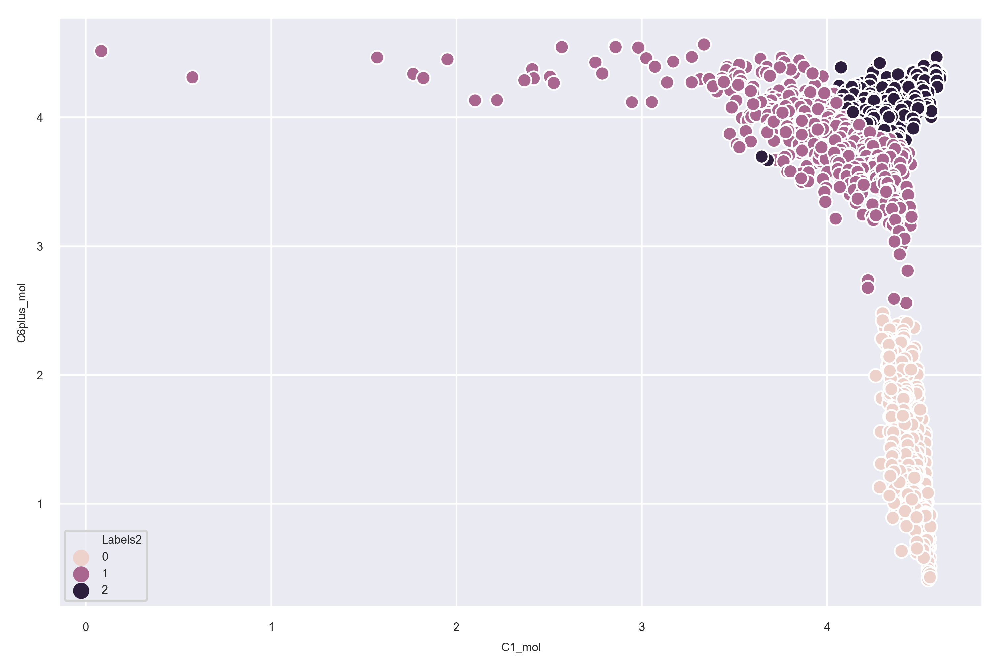

In [7]:
# plt.subplot(1,2,1)
# sns.scatterplot((total_x_r.C1_mol), (total_y.C6plus_mol), hue = total_y.Labels)
# plt.grid()
# plt.subplot(1,2,2)
# # sns.scatterplot((total_x_r.C1_mol), (total_y.C6plus_mol), hue = label_pred)

sns.scatterplot(np.log1p(total_x_r.C1_mol), np.log1p(total_y.C6plus_mol), hue = total_y.Labels2)
plt.grid()
plt.tight_layout()

####

## Test data

In [8]:
# fn2 = 'C:/YujianWu/Data/AMG/NewTestcase - Copy.csv'
fn2 = 'C:/YujianWu/Data/AMG/NewTestcase - 85PVTsamples.csv'

test_features = pd.read_csv(fn2)
# test_x = test_features.iloc[:,0:5].astype(float)
# test_x.columns = [i[:3]+'mol' for i in test_x.columns]
# test_x = test_x.fillna(0)

# test_y = test_features['C6plus_percntmol']

X_test = np.log1p(feat_eng(test_features[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]))
# y_test = np.log1p(test_y)

# X_test2 = X_test[(~X_test.Ch.isnull()) & (np.isfinite(X_test.Ch))]
# y_test2 = y_test[(~X_test.Ch.isnull()) & (np.isfinite(X_test.Ch))]

In [9]:
Y_test_C6 = test_features['C6plus_mol']
X_test = X_test.dropna()
X_test

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,Wh,Bh,Ch
0,4.342814,2.369844,2.103686,1.729274,1.266298,3.221924,1.939291,0.692308
1,4.234970,2.595663,2.355495,1.964242,1.581457,3.494699,1.632968,0.716358
2,4.258206,2.577185,2.308709,1.899086,1.485154,3.444158,1.706122,0.695022
3,4.389479,2.429631,1.814640,1.393202,1.057884,3.063463,2.297910,0.670428
4,4.388292,2.432278,1.820335,1.396805,1.063407,3.067922,2.291407,0.670132
5,4.388626,2.429838,1.821358,1.399446,1.057813,3.066671,2.291322,0.668995
6,4.386423,2.435104,1.828882,1.408851,1.068949,3.074890,2.279798,0.671550
7,4.402920,2.447711,1.836119,0.936800,1.073337,3.011159,2.436222,0.506510
8,4.398192,2.413760,1.778548,1.354506,1.002188,3.029952,2.351740,0.659867
9,4.398157,2.415096,1.775538,1.353372,1.005911,3.030092,2.353004,0.662225


### EDA

In [ ]:
# Raw features
for i in range(total_x.shape[1]):
    if i< total_x.shape[1]:
        plt.subplot(4, 3, i+1)
        sns.scatterplot((np.log1p(total_x.iloc[:,i])), np.log1p(np.log1p(total_y)), linewidth = 0.1, s = 1)
#         plt.xlabel(total_x_g.columns[i][:-3]+', Weight Percent')
        plt.ylabel('C6+')
        plt.title(total_x.columns[i].replace('_wt', ''), fontsize = 5)
        plt.grid()
plt.tight_layout()
plt.show()

# 4. Modelling (Training and validation)

## SVM

In [ ]:
par_spa = {
        'C': hp.uniform('C', 0, 100),
        'kernel': hp.choice('kernel', ['rbf']),
        'gamma': hp.uniform('gamma', 0, 100)
}
y_l = [1 if i == 'Oil' else 0 for i in total_y.Fluid_Type]
C6s = BaseModels(SVC, pd.DataFrame(total_x_r), pd.DataFrame(y_l), pd.DataFrame(total_x_r), pd.DataFrame(y_l), 5)
a, _, _ = C6s.tuning(par_spa, 1000)

In [ ]:
a['kernel'] = 'rbf'

In [ ]:
a

In [ ]:
svm = SVC(**a)

In [ ]:
accuracy_score(svm.fit(pd.DataFrame(total_x_r), pd.DataFrame(y_l)).predict(pd.DataFrame(total_x_r)), y_l)

In [ ]:
svm.predict(X_test)

In [ ]:
clabel = ['Oil', 'GC']
sns.heatmap(confusion_matrix(svm.fit(pd.DataFrame(total_x_r), pd.DataFrame(y_l)).predict(pd.DataFrame(total_x_r)), y_l), xticklabels=clabel, yticklabels=clabel, annot=True, cbar = False, cmap="YlGnBu", fmt = 'g')

In [ ]:
# test = pd.DataFrame(np.array([73.9, 11.05, 6.53, 5.33, 3.19]), index=total_x.columns.ravel())
# test = pd.DataFrame(np.array([92.21, 6.15, .73, .51, .40]), index=total_x.columns.ravel())
# svm.predict(feat_eng(test.T))

## SVR

### Tuning

In [ ]:
C6s = BaseModels(SVR, pd.DataFrame(X_train2), pd.DataFrame(y_train2), pd.DataFrame(X_val2), pd.DataFrame(y_val2), 5)

In [ ]:
s_bp, _, trials = C6s.tuningSVR(1000)

In [ ]:
plot_trials(trials)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/svr_train_val_renormalized_C1_C5_feature_engineering_5000.pickle', 'wb') as f:
    pickle.dump([s_bp, trials], f)

### Predictions

In [ ]:
with open('C:/YujianWu/Data/AMG/20190422/svr_train_val_renormalized_C1~C5_feature_engineering_1000.pickle', 'rb') as f:
    s_bp, _ = pickle.load(f)

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp))
s_pred = svr.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_val2))
# s_pred2 = svr.fit(pd.DataFrame(X_train2), (y_train2)).predict(X_test)

In [ ]:
# Validation
s_mse = mean_squared_error(s_pred, y_val2)
plot_pred(s_pred, y_val2, 'SVR', s_mse)

In [ ]:
# Test
s_mse2 = mean_squared_error(s_pred2, y_test)
plot_pred(s_pred2, y_test, 'SVR', s_mse2)

## KRR

In [ ]:
krr_t = BaseModels(KernelRidge, X_train2, pd.DataFrame(y_train2), X_val2, pd.DataFrame(y_val2), 5)
k_par = {'alpha': hp.uniform('alpha', 0, 1000),
         'kernel': hp.choice('kernel', ['rbf']), 
         'gamma':hp.uniform('gamma', 0, 1000)}
k_bp, _, _ = krr_t.tuning(k_par, 3000)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/KRR_train_val_renormalized_C1_C5_feature_engineering_3000.pickle', 'wb') as f:
    pickle.dump(k_bp, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/KRR_train_val_renormalized_C1_C5_feature_engineering_3000.pickle', 'rb') as f:
    k_bp = pickle.load(f)

In [ ]:
k_bp['kernel'] = 'rbf'
krr = make_pipeline(RobustScaler(), KernelRidge(**k_bp))
k_pred = krr.fit(X_train2, y_train2).predict(X_val2)

In [ ]:
k_mse = mean_squared_error(k_pred, y_val2)
plot_pred(k_pred, y_val2, 'KRR', k_mse)

## Lasso

In [ ]:
lasso_t = BaseModels(Lasso, pd.DataFrame(X_train2), pd.DataFrame(y_train2), pd.DataFrame(X_val2), pd.DataFrame(y_val2), 5)
l_par = {'alpha': hp.uniform('alpha', 0, 1000)}
l_bp, _, _ = lasso_t.tuning(l_par, 5000)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190422/Lasso_train_val_renormalized_C1~C5_feature_engineering_5000.pickle', 'wb') as f:
    pickle.dump(l_bp, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190422/Lasso_train_val_renormalized_C1~C5_feature_engineering_5000.pickle', 'rb') as f:
    l_bp = pickle.load(f)

In [ ]:
lasso = make_pipeline(RobustScaler(), Lasso(**l_bp, random_state=42))
l_pred = lasso.fit(pd.DataFrame(X_train2), pd.DataFrame(y_train2)).predict(pd.DataFrame(X_val2))

In [ ]:
l_mse = mean_squared_error(l_pred, y_val2)
plot_pred(l_pred, y_val2, 'Lasso', l_mse)

## GPR

In [ ]:
gpr_t = BaseModels(GaussianProcessRegressor, X_train2, pd.DataFrame(y_train2), X_val2, pd.DataFrame(y_val2), 5)
g_par = {
    'length': hp.uniform('length', 1e-10, 100),
    'alpha': hp.uniform('alpha', 0,100)
        }
g_bp, _, _ = gpr_t.tuning(g_par, 500)
g_bp['kernel'] = RBF(length_scale=g_bp['length'])
g_bp.pop('length', None)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/GPR_train_val_renormalized_C1_C5_feature_engineering_500.pickle', 'wb') as f:
    pickle.dump(g_bp, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/GPR_train_val_renormalized_C1_C5_feature_engineering_500.pickle', 'rb') as f:
    g_bp = pickle.load(f)

In [ ]:
# g_bp['kernel'] = RBF(length_scale=g_bp['length'])
# g_bp.pop('length', None)
gpr = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp))
g_pred = gpr.fit(X_train2, y_train2).predict(X_val2)
g_mse = mean_squared_error(g_pred, y_val2)

In [ ]:
plot_pred(g_pred, y_val2, 'GPR', g_mse)

## RF

#### C1~C5, C6+

In [ ]:
rf_traces = []
for epo in range(5):
    key = np.random.randint(0, 10000)
    # Split
    X_train, X_val, y_train, y_val = train_test_split(total_x_r, total_y, test_size = 0.2, random_state = key)
    X_train2, X_val2, y_train2, y_val2 = np.log1p(X_train), np.log1p(X_val), np.log1p(y_train), np.log1p(y_val)
    # Separate C6+ and GOR
    y_train_label, y_val_label = y_train['Labels'], y_val['Labels']
    y_trainC6, y_valC6, y_train_GOR, y_val_GOR = y_train['C6plus_mol'], y_val['C6plus_mol'], y_train['GOR_scf_stb'], y_val['GOR_scf_stb']
    y_trainC6_log, y_valC6_log, y_train_GOR_log, y_val_GOR_log = np.log1p(y_trainC6), np.log1p(y_valC6), np.log1p(y_train_GOR), np.log1p(y_val_GOR)
    
    C6rf = BaseModels(RandomForestRegressor, pd.DataFrame(X_train2), pd.DataFrame(y_trainC6_log), pd.DataFrame(X_val2), pd.DataFrame(y_valC6_log), 5)
    rf_bp, _, trials = C6rf.tuningRF(50)
    rf_traces.append([key, rf_bp, _, trials])

In [ ]:
with open('C:/YujianWu/Data/AMG/20190429 SVM+Separate GPR/gor10000_RF_5epochs_50iterations.pickle', 'wb') as f:
    pickle.dump(rf_bp, f)

In [ ]:
C6rf = BaseModels(RandomForestRegressor, pd.DataFrame(X_train2), pd.DataFrame(y_trainC6_log), pd.DataFrame(X_val2), pd.DataFrame(y_valC6_log), 5)

In [ ]:
# rf_bp, _, _ = C6rf.tuningRF(50)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/RF_train_val_renormalized_C1_C5_feature_engineering_100.pickle', 'wb') as f:
    pickle.dump(rf_bp, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190422/RF_train_val_renormalized_C1~C5_feature_engineering_1000.pickle', 'rb') as f:
    rf_bp, t  = pickle.load(f)

In [ ]:
rf_bp = rf_traces[2][1]

In [ ]:
rf_bp

In [ ]:
rf = RandomForestRegressor(**rf_bp)
rf_pred = rf.fit(pd.DataFrame(X_train2), pd.DataFrame(y_trainC6_log)).predict(pd.DataFrame(X_val2))
rf_pred2 = rf.fit(pd.DataFrame(X_train2), (y_trainC6_log)).predict(pd.DataFrame(X_train2))

In [ ]:
plot_pred(rf_pred, y_valC6_log, 'RF', mean_squared_error(rf_pred, y_valC6_log))

In [ ]:
plot_pred(rf_pred2, y_trainC6_log, 'RF', mean_squared_error(rf_pred2, y_trainC6_log))

#### plots

In [ ]:
[i[0] for i in rf_traces]

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/RF_train_val_renormalized_C1_C5_feature_engineering_50iterations_5epochs.pickle', 'rb') as f:
    rf_traces = pickle.load(f)
rf_traces = rf_traces[1:]

In [ ]:
def trial_array(trials, term):
    return [i['result'][term] for i in trials]

In [ ]:
test_loss = np.array([min(trial_array(rf_traces[i][3], 'test')) for i in range(5)])**2
train_loss = np.array([min(trial_array(rf_traces[i][3], 'loss')) for i in range(5)])**2

In [ ]:
test_loss

In [ ]:
sns.barplot(data = [train_loss, test_loss])
plt.xticks(list(range(2)), ['Training Error', 'Validation Error'], fontsize = 15)
plt.ylabel('Mean Squared Error', fontsize = 15)
plt.title('Training and Validation Errors (5 Epochs)', fontsize = 15)
plt.grid()
plt.show()

In [ ]:
plot_trials(rf_traces[2][3])

In [ ]:
key = rf_traces[4][0]
rf_par1 = rf_traces[4][1]

In [ ]:
pre_par = [i for i in rf_traces[4][3] if i['result']['test'] == 0.2540521044363564]
pre_par = pre_par[0]['misc']['vals']
pre_par = {i:int(pre_par[i][0]) for i in pre_par.keys()}
pre_par['criterion'] = 'mae'
pre_par['n_jobs'] = -1
pre_par['random_state'] = 42

In [ ]:
pre_par

In [ ]:
X_train, y_train = np.log1p(total_x), np.log1p(total_y)

In [ ]:
# Minimum training error
rf = RandomForestRegressor(**rf_par1)
rf_pred = rf.fit(pd.DataFrame(X_train), (y_train)).predict(pd.DataFrame(X_test))
# rf_pred2 = rf.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_test))

In [ ]:
plot_pred(rf_pred, y_test, 'RF', mean_squared_error(rf_pred, y_test))

In [ ]:
# Minimum validationi error
rf = RandomForestRegressor(**pre_par)
rf_pred = rf.fit(pd.DataFrame(X_train), (y_train)).predict(pd.DataFrame(X_test))
# rf_pred2 = rf.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_test))
plot_pred(rf_pred, y_test, 'RF', mean_squared_error(rf_pred, y_test))

## 5. SVR C1/C6+, GOR

####

In [ ]:
C6s2 = BaseModels(SVR, pd.DataFrame(new_xtrain2), pd.DataFrame(y_train_g2), pd.DataFrame(new_xval2), pd.DataFrame(y_val_g2), 5)
s_bp2, _, _ = C6s2.tuningSVR(500)

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp2))
s_pred = svr.fit(pd.DataFrame(new_xtrain2), (y_train_g2)).predict(pd.DataFrame(new_xtrain2))
# Training
s_mse = mean_squared_error(s_pred, y_train_g2)
plot_pred2(s_pred, y_train_g2, 'SVR', s_mse)

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp2))
s_pred = svr.fit(pd.DataFrame(new_xtrain2), (y_train_g2)).predict(pd.DataFrame(new_xval2))
# Validation
s_mse = mean_squared_error(s_pred, y_val_g2)
plot_pred2(s_pred, y_val_g2, 'SVR', s_mse)

In [ ]:
plt.subplot(1,2,1)
sns.scatterplot(new_xtrain2, y_train_g2)
plt.xlabel('Renomalized C1/Raw C6')
plt.subplot(1,2,2)
sns.scatterplot(np.log1p(training_features.C1_mol/training_features.C6plus_mol), np.log1p(training_features.GOR_scf_stb))
plt.xlabel('Raw C1/Raw C6')
plt.tight_layout()

#### C1/C6+, GOR<5000

In [ ]:
C6s2 = BaseModels(SVR, pd.DataFrame(new_xtrain2), pd.DataFrame(y_train_g2), pd.DataFrame(new_xval2), pd.DataFrame(y_val_g2), 5)
s_bp2, _, _ = C6s2.tuningSVR(500)

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp2))
s_pred = svr.fit(pd.DataFrame(new_xtrain2), (y_train_g2)).predict(pd.DataFrame(new_xtrain2))
# Training
s_mse = mean_squared_error(s_pred, y_train_g2)
plot_pred2(s_pred, y_train_g2, 'SVR', s_mse)

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp2))
s_pred = svr.fit(pd.DataFrame(new_xtrain2), (y_train_g2)).predict(pd.DataFrame(new_xval2))
# Validation
s_mse = mean_squared_error(s_pred, y_val_g2)
plot_pred2(s_pred, y_val_g2, 'SVR', s_mse)

In [ ]:
plt.subplot(1,2,1)
sns.scatterplot((total_x.C1_mol[training_features.GOR_scf_stb<10000]/total_y.C6plus_mol[training_features.GOR_scf_stb<10000]), \
                (training_features.GOR_scf_stb[training_features.GOR_scf_stb<10000]))
plt.xlabel('Renormalized C1/Raw C6+')
plt.subplot(1,2,2)
sns.scatterplot(np.log10(total_x.C1_mol[training_features.GOR_scf_stb<10000]/total_y.C6plus_mol[training_features.GOR_scf_stb<10000]), \
                np.log10(training_features.GOR_scf_stb[training_features.GOR_scf_stb<10000]))
plt.xlabel('Renormalized C1/Raw C6+')
plt.tight_layout()

In [ ]:
len(total_x.C1_mol[training_features.GOR_scf_stb>10000]), len(total_x.C1_mol[training_features.GOR_scf_stb<10000])

In [ ]:
plt.subplot(1,2,1)
sns.scatterplot((total_x.C1_mol[training_features.GOR_scf_stb>10000]/total_y.C6plus_mol[training_features.GOR_scf_stb>10000]), \
                (training_features.GOR_scf_stb[training_features.GOR_scf_stb>10000]))
plt.xlabel('Raw C1/Raw C6')
plt.subplot(1,2,2)
sns.scatterplot(np.log10(total_x.C1_mol[training_features.GOR_scf_stb>10000]/total_y.C6plus_mol[training_features.GOR_scf_stb>10000]), \
                np.log10(training_features.GOR_scf_stb[training_features.GOR_scf_stb>10000]))
plt.xlabel('Raw C1/Raw C6')
plt.tight_layout()

In [ ]:
training_features.GOR_scf_stb[training_features.GOR_scf_stb<5000].max()

## LGBM

In [ ]:
lgbm_traces = []

In [ ]:
for i in range(5):
    key = np.random.randint(0, 10000)
    X_train, X_val, y_train, y_val = train_test_split(total_x, total_y, test_size = 0.2, random_state = key)
    X_train2, X_val2, y_train2, y_val2 = np.log1p(X_train), np.log1p(X_val), np.log1p(y_train), np.log1p(y_val)
    C6g = BaseModels(LGBMRegressor, pd.DataFrame(X_train2), pd.DataFrame(y_train2), pd.DataFrame(X_val2), pd.DataFrame(y_val2), 5)
    g_bp, _, l_trials = C6g.tuningLGB(1000)
    lgbm_traces.append([key, g_bp, _, l_trials])

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/LGBM_train_val_renormalized_C1_C5_feature_engineering_1000iterations_5epochs.pickle', 'wb') as f:
    pickle.dump(lgbm_traces, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190422/LGBM_train_val_renormalized_C1_C5_feature_engineering_1000.pickle', 'rb') as f:
    g_bp, _ = pickle.load(f)

In [ ]:
gb = LGBMRegressor(**g_bp)
gb_pred = gb.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_val2))

In [ ]:
plot_pred(gb_pred, y_val2, 'LGBM', mean_squared_error(gb_pred, y_val2))

In [ ]:
with open('C:/YujianWu/Data/AMG/20190423MolePercent/LGBM_train_val_renormalized_C1_C5_feature_engineering_1000iterations_5epochs.pickle', 'rb') as f:
    lgbm_traces = pickle.load(f)

In [ ]:
lgbm_traces[1][1]

## Ensemble

In [ ]:
rf_bp2 = copy.copy(rf_bp)
rf_bp2['max_features'] = 1

In [ ]:
stacked_averaged_models = StackingAveragedModels(base_models = [lasso, rf, lgb, svr], meta_model = krr)
stacked_averaged_models.fit(X_train2.values, y_train2.ravel())
stacked_train_pred = (stacked_averaged_models.predict(X_val2))
stack_mse = mean_squared_error(y_val2, stacked_train_pred)
plot_pred(stacked_train_pred, y_val2, 'Ensemble', stack_mse)

In [ ]:
# k = 0.8*stacked_train_pred +  0.2*s_pred
# stack_mse = mean_squared_error(y_val2, k)
# plot_pred(k, y_val2, 'Stacking', stack_mse)

# 6. Workflow: renormalized C1~C5 to C6+ to GOR

## $Choose\ a\ model,\ C1/C6\ or\ C1\ and\ C6$

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Ratio_500.pickle', 'rb') as f:
    s_bp2 = pickle.load(f)

In [ ]:
# Tuning C1/C6
# C6s2 = BaseModels(SVR, pd.DataFrame(new_xtrain2), pd.DataFrame(y_train_g2), pd.DataFrame(new_xval2), pd.DataFrame(y_val_g2), 5)
# s_bp2, _, _ = C6s2.tuningSVR(500)
# # Prediction
svr = make_pipeline(RobustScaler(), SVR(**s_bp2))
s_pred = svr.fit(pd.DataFrame(new_xtrain2), (y_train_g2)).predict(pd.DataFrame(new_xval2))
# Validation
s_mse = mean_squared_error(s_pred, y_val_g2)
plot_pred2(s_pred, y_val_g2, 'SVR', s_mse)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Ratio_500.pickle', 'wb') as f:
    pickle.dump(s_bp2, f)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Separately_200.pickle', 'rb') as f:
    s_bp3 = pickle.load(f)

In [ ]:
#Tuning C1 and C6
# C6s3 = BaseModels(SVR, pd.DataFrame(new_xtrain3), pd.DataFrame(y_train_g2), pd.DataFrame(new_xval3), pd.DataFrame(y_val_g2), 5)
# s_bp3, _, _ = C6s3.tuningSVR(200)
# Prediction
svr = make_pipeline(RobustScaler(), SVR(**s_bp3))
s_pred3 = svr.fit(pd.DataFrame(new_xtrain3), (y_train_g2)).predict(pd.DataFrame(new_xval3))
# Validation
s_mse3 = mean_squared_error(s_pred3, y_val_g2)
plot_pred2(s_pred3, y_val_g2, 'SVR', s_mse3)

In [ ]:
with open('C:/YujianWu/Data/AMG/20190425C1C5toC6toGOR/RenormC1RawC6Separately_200.pickle', 'wb') as f:
    pickle.dump(s_bp3, f)

## $Predicting\ C6+,\ RF$

In [40]:
rf_par = {'criterion': 'mae',
 'max_depth': 10,
 'max_features': 4,
 'n_estimators': 360,
 'n_jobs': -1,
 'random_state': 42}

# l_bp = {'boosting_type': 'gbdt',
#  'colsample_bytree': 0.771417424429508,
#  'learning_rate': 0.04231188366299476,
#  'max_depth': 6,
#  'metric': 'rmsle',
#  'min_child_samples': 30,
#  'n_estimators': 880,
#  'num_leaves': 92,
#  'reg_alpha': 0.5689555775490103,
#  'reg_lambda': 0.3255242385936701,
#  'subsample_for_bin': 160000}

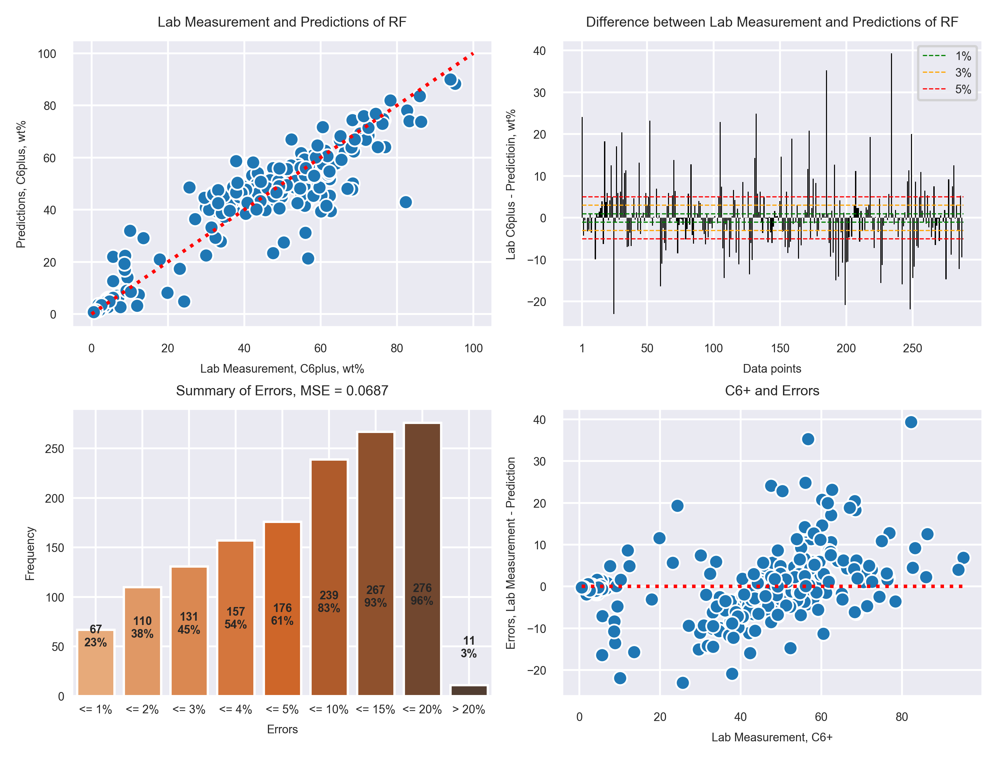

In [43]:
rf = RandomForestRegressor(**rf_par)
rf_pred_C6 = rf.fit(pd.DataFrame(X_train), (y_trainC6_log)).predict(pd.DataFrame(X_val))
plot_pred(rf_pred_C6, y_valC6_log, 'RF', mean_squared_error(rf_pred_C6, y_valC6_log))

# lgb = LGBMRegressor(**l_bp)
# lgb_pred_C6 = lgb.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_val2))

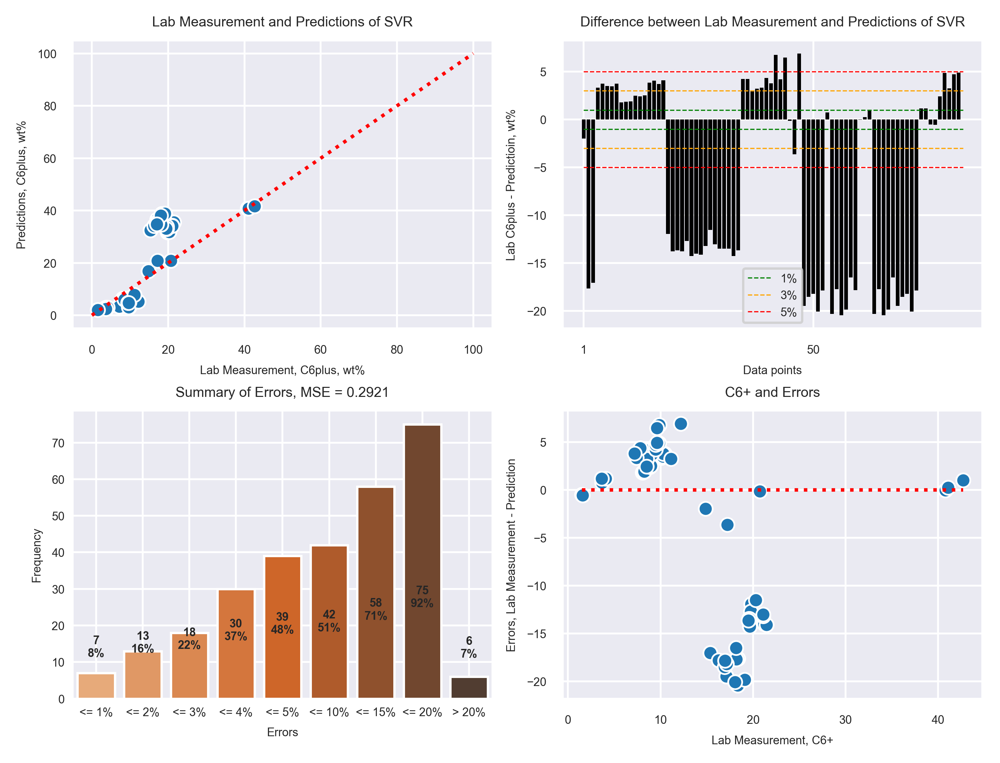

In [49]:
rf_pred_C6 = rf.predict(X_test)
plot_pred(rf_pred_C6, np.log1p(Y_test_C6), 'SVR', mean_squared_error(rf_pred_C6, np.log1p(Y_test_C6)))

In [ ]:
rf_pred_C6_train = rf.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_train2))
lgb_pred_C6_train = lgb.fit(pd.DataFrame(X_train2), (y_train2)).predict(pd.DataFrame(X_train2))

## $Renormalized\ C1\ and\ predicted\ C6+\ for\ GOR\ prediction$

In [ ]:
new_xval4 = pd.DataFrame({
    'C1 mole': new_xval3['C1_mol'].values.ravel(), 
    'C6+ Predicted': rf_pred_C6.ravel()
})

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(**s_bp3))
s_pred4 = svr.fit(pd.DataFrame(new_xtrain3), (y_train_g2)).predict(pd.DataFrame(new_xval4))
# Validation
s_mse4 = mean_squared_error(s_pred4, y_val_g2)
plot_pred2(s_pred4, y_val_g2, 'SVR', s_mse4)

# 7. Boosting experiments

In [ ]:
X_train_boost = pd.concat((X_train2.reset_index(drop = True), pd.DataFrame(rf_pred_C6_train, columns=['pred_train']), pd.DataFrame(lgb_pred_C6_train, columns=['pred_train2'])), axis = 1)
X_val_boost = pd.concat((X_val2.reset_index(drop = True), pd.DataFrame(rf_pred_C6, columns=['pred_val']), pd.DataFrame(lgb_pred_C6, columns=['pred_val2'])), axis = 1)

In [ ]:
# C6sb = BaseModels(RandomForestRegressor, pd.DataFrame(X_train_boost), pd.DataFrame(y_train2), pd.DataFrame(X_val_boost), pd.DataFrame(y_val2), 5)
# s_bpsb, _, _ = C6sb.tuningRF(20)

In [ ]:
test_par = {'n_estimators':10}

In [ ]:
# svr_boosting = make_pipeline(StandardScaler(), SVR(**s_bpsb))
svr_boosting = RandomForestRegressor(**s_bpsb)

s_pred = lgb.fit(pd.DataFrame(X_train_boost), pd.DataFrame(y_train2).values.ravel()).predict(pd.DataFrame(X_val_boost))
# Training
s_mse = mean_squared_error(s_pred, y_val2.values.ravel())
plot_pred(s_pred, y_val2, 'Boosted RF', mean_squared_error(s_pred, y_val2))

# 8. SVM and GPR workflow

### Tuning classifcation models

In [11]:
# C_svm = BaseModels(SVC, X_train2, y_train_label, X_val2, y_val_label, 5)
# par_spa = {
#         'C': hp.uniform('C', 0, 100),
#         'kernel': hp.choice('kernel', ['rbf']),
#         'gamma': hp.uniform('gamma', 0, 100)
# }
# a, _, _ = C_svm.tuning(par_spa, 100)
# a['kernel'] = 'rbf'

In [131]:
# ## Randomforest for 1st classification
# C_rf = BaseModels(RandomForestClassifier, X_train2, y_train.Labels, X_val2, y_val.Labels, 5)
# par_spa = {
#         'n_estimators': scope.int(hp.uniform('n_estimators', 0, 1000)),
# #         'max_depth': hp.choice('kernel', ['rbf']),
#         'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
# }
# a3, _, _ = C_rf.tuning(par_spa, 50)
a3 = {'max_depth': 21, 'n_estimators': 327}
rf3 = RandomForestClassifier(**a3)
tr_pred = rf3.fit(X_train2, y_train.Labels).predict(X_train2)
te_pred = rf3.predict(X_val2)
accuracy_score(tr_pred, y_train.Labels), accuracy_score(te_pred, y_val.Labels)

(1.0, 0.9686411149825784)

In [140]:
# Random forest for 2nd classification
# x1, y1, x2, y2 = X_train2[y_train.Labels == 1], y_train.loc[y_train.Labels == 1, 'Labels2'], X_val2[y_val.Labels == 1], y_val.loc[y_val.Labels == 1, 'Labels2']
# C_rf = BaseModels(RandomForestClassifier, x1, y1, x2, y2, 5)
# par_spa = {
#         'n_estimators': scope.int(hp.uniform('n_estimators', 0, 1000)),
#         'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
# }
# a3, _, _ = C_rf.tuning(par_spa, 50)
a3 = {'max_depth': 27, 'n_estimators': 406}
rf3 = RandomForestClassifier(**a3)
tr_pred = rf3.fit(x1, y1).predict(x1)
te_pred = rf3.predict(x2)
accuracy_score(tr_pred, y1), accuracy_score(te_pred, y2)

(1.0, 0.8761467889908257)

In [11]:
# ## SVR for 1st classification
a = {'C': 18.01425825418445, 'gamma': 9.778811169089607, 'kernel': 'rbf'}
svm = make_pipeline(RobustScaler(), SVC(**a))
label_pred = svm.fit(X_train2, y_train_label).predict(X_val2)
accuracy_score(label_pred, y_val_label)

0.9825783972125436

In [12]:
# ## SVR for 2nd classification
svm2 = make_pipeline(RobustScaler(), SVC(**a))
label_pred2 = svm2.fit(X_train2[y_train.Labels == 1], y_train.loc[y_train.Labels == 1, 'Labels2']).predict(X_val2[y_val.Labels == 1])
accuracy_score(label_pred2, y_val.loc[y_val.Labels == 1, 'Labels2'])

0.7981651376146789

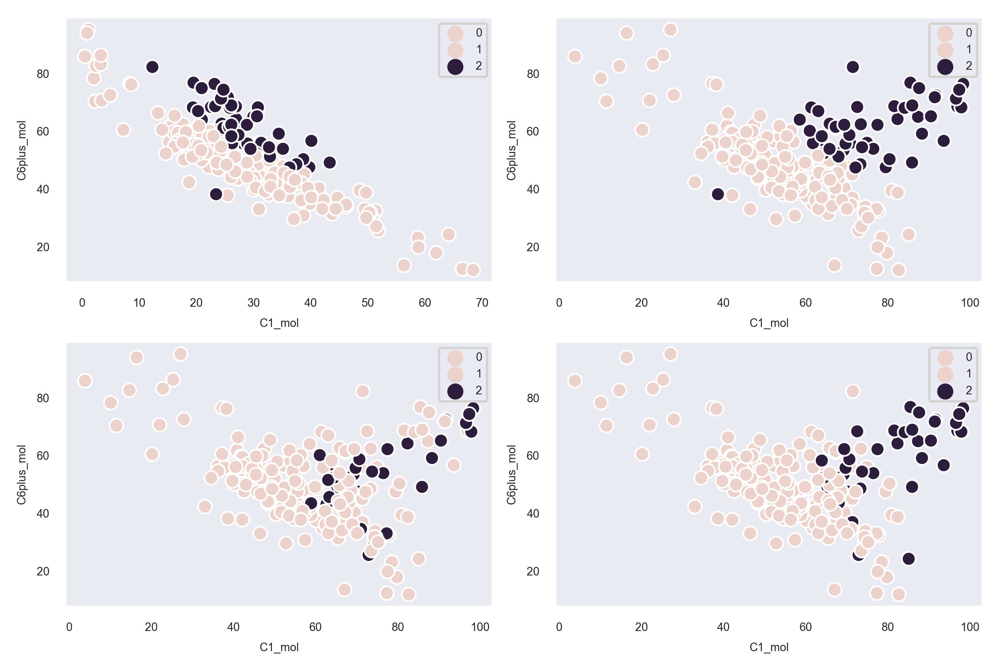

In [139]:
plt.subplot(2,2,1)
k_data = X_val2[y_val.Labels == 1]
sns.scatterplot((total_x.iloc[k_data.index,:].C1_mol), np.expm1(y_valC6_log[y_val.Labels == 1]), hue = y_val.loc[y_val.Labels == 1, 'Labels2'].values.ravel())

plt.subplot(2,2,2)
sns.scatterplot(np.expm1(X_val2[y_val.Labels == 1].C1_mol), np.expm1(y_valC6_log[y_val.Labels == 1]), hue = y_val.loc[y_val.Labels == 1, 'Labels2'].values.ravel())

plt.subplot(2,2,3)
sns.scatterplot(np.expm1(X_val2[y_val.Labels == 1].C1_mol), np.expm1(y_valC6_log[y_val.Labels == 1]), hue = label_pred2)

plt.subplot(2,2,4)
sns.scatterplot(np.expm1(X_val2[y_val.Labels == 1].C1_mol), np.expm1(y_valC6_log[y_val.Labels == 1]), hue = te_pred)
plt.tight_layout()
plt.show()

#### All three lebels classification

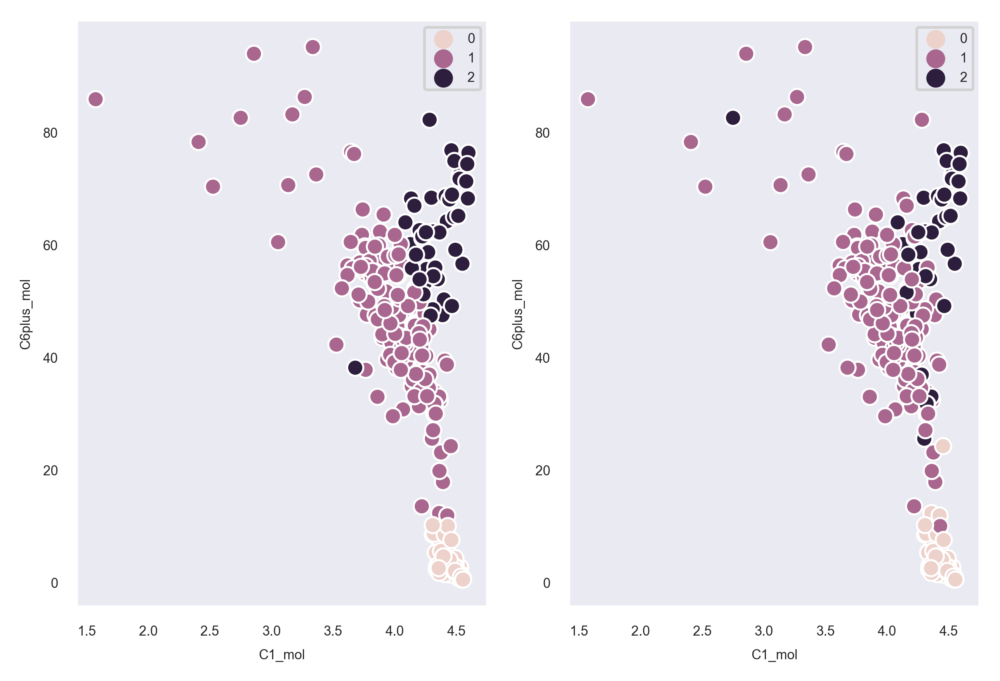

In [113]:
# C_svm3 = BaseModels(SVC, X_train2, y_train.Labels2, X_val2, y_val.Labels2, 5)
# par_spa = {
#         'C': hp.uniform('C', 0, 100),
#         'kernel': hp.choice('kernel', ['rbf']),
#         'gamma': hp.uniform('gamma', 0, 100)
# }
# a3, _, _ = C_svm3.tuning(par_spa, 100)
# a3['kernel'] = 'rbf'
a3 = {'C': 37.76409978634882, 'gamma': 5.320914999212999, 'kernel': 'rbf'}
svm3 = SVC(**a3)

tr_pred = svm3.fit(X_train2, y_train.Labels2).predict(X_train2)
te_pred = svm3.predict(X_val2)
accuracy_score(tr_pred, y_train.Labels2), accuracy_score(te_pred, y_val.Labels2)

plt.subplot(1,2,1)
sns.scatterplot(X_val2.C1_mol, y_val.C6plus_mol, hue = y_val.Labels2.ravel())

plt.subplot(1,2,2)
sns.scatterplot(X_val2.C1_mol, y_val.C6plus_mol, hue = te_pred)

In [117]:
C_rf = BaseModels(RandomForestRegressor, X_train2, y_train.Labels2, X_val2, y_val.Labels2, 5)
par_spa = {
        'n_estimators': scope.int(hp.uniform('n_estimators', 0, 1000)),
#         'max_depth': hp.choice('kernel', ['rbf']),
        'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
}
a3, _, _ = C_rf.tuning(par_spa, 100)
# a3['kernel'] = 'rbf'

100%|████████████████████████████████████████████████| 100/100 [08:46<00:00,  5.24s/it, best loss: 0.27631622051149635]


In [120]:
a3 = {'max_depth': 8, 'n_estimators': 772}
rf3 = RandomForestClassifier(**a3)
tr_pred = rf3.fit(X_train2, y_train.Labels2).predict(X_train2)
te_pred = rf3.predict(X_val2)
accuracy_score(tr_pred, y_train.Labels2), accuracy_score(te_pred, y_val.Labels2)

(0.9816433566433567, 0.8745644599303136)

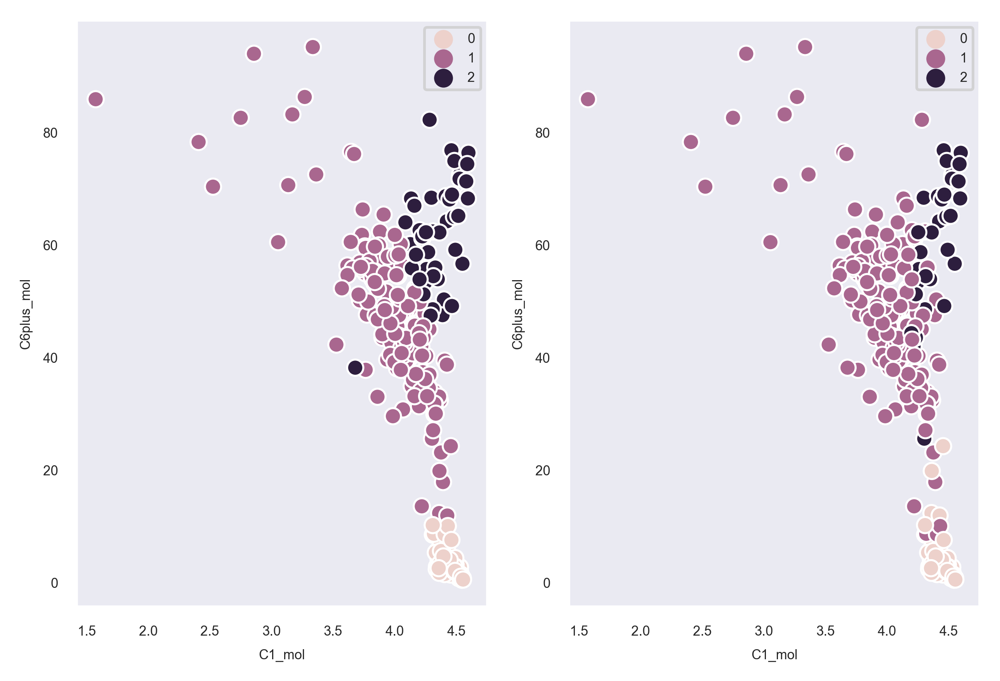

In [121]:
plt.subplot(1,2,1)
sns.scatterplot(X_val2.C1_mol, y_val.C6plus_mol, hue = y_val.Labels2.ravel())

plt.subplot(1,2,2)
sns.scatterplot(X_val2.C1_mol, y_val.C6plus_mol, hue = te_pred)

### Predictions models

In [17]:
def getSeparateData(lab):
#     s_tr_lab = y_train_label[y_train_label == lab]
    x_tr = X_train2[y_train.Labels == lab]
    y_tr = y_train[y_train.Labels == lab]
    
#     s_val_lab = y_val_label[y_val_label == lab]
    x_va = X_val2[y_val.Labels == lab]
    y_va = y_val[y_val.Labels == lab]
    return x_tr, y_tr, x_va, y_va

In [18]:
# data with label as 1
x_tr1, y_tr1, x_va1, y_va1 = getSeparateData(1)
# data with label as 0
x_tr0, y_tr0, x_va0, y_va0 = getSeparateData(0)

In [19]:
y_tr1.head()

,C6plus_mol,GOR_scf_stb,Labels,Labels2
895,37.272474,1038.213500,1,1
317,58.882255,325.945135,1,1
327,57.983529,331.054785,1,1
733,40.809581,713.048850,1,1
297,54.617625,314.451230,1,1


#### GPR

In [ ]:
# data with label 1, optimization
gpr_t = BaseModels(SVR, x_tr1, pd.DataFrame(y_tr1), x_va1, pd.DataFrame(y_va1), 5)
# g_par = {
#     'length': hp.uniform('length', 1e-10, 100),
#     'alpha': hp.uniform('alpha', 0,100)
#         }
g_bp, _, _ = gpr_t.tuningSVR(1000)
# g_bp['kernel'] = RBF(length_scale=g_bp['length'])
# g_bp.pop('length', None)

In [ ]:
# gpr1 = make_pipeline(RobustScaler(), SVR(**g_bp1))
# g_pred1 = gpr1.fit(x_tr1, y_tr1).predict(x_va1)
# plot_pred(g_pred1, y_va1, 'GPR', mean_squared_error(g_pred1, y_va1))

In [26]:
g_bp1 = {'alpha': 0.03675197648117656, 'kernel': RBF(length_scale=15.4)}

In [ ]:
# # data with label 0, optimization
# gpr_t = BaseModels(GaussianProcessRegressor, x_tr0, pd.DataFrame(y_tr0), x_va0, pd.DataFrame(y_va0), 5)
# g_par = {
#     'length': hp.uniform('length', 1e-10, 100),
#     'alpha': hp.uniform('alpha', 0,100)
#         }
# g_bp, _, _ = gpr_t.tuning(g_par, 300)
# g_bp['kernel'] = RBF(length_scale=g_bp['length'])
# g_bp.pop('length', None)

In [80]:
x_tr0.head()

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,Wh,Bh,Ch
1175,4.491709,1.986531,1.241167,1.027541,0.780265,2.543654,2.912148,0.793004
1282,4.535952,1.768445,0.952314,0.607235,0.335671,2.161904,3.566333,0.574034
1359,4.536405,1.765942,0.948324,0.605472,0.325595,2.157031,3.576140,0.570732
1348,4.440961,2.262527,1.594257,1.225017,0.791778,2.841622,2.585451,0.652438
1395,4.535287,1.786245,0.966435,0.566773,0.330447,2.169022,3.581742,0.535733


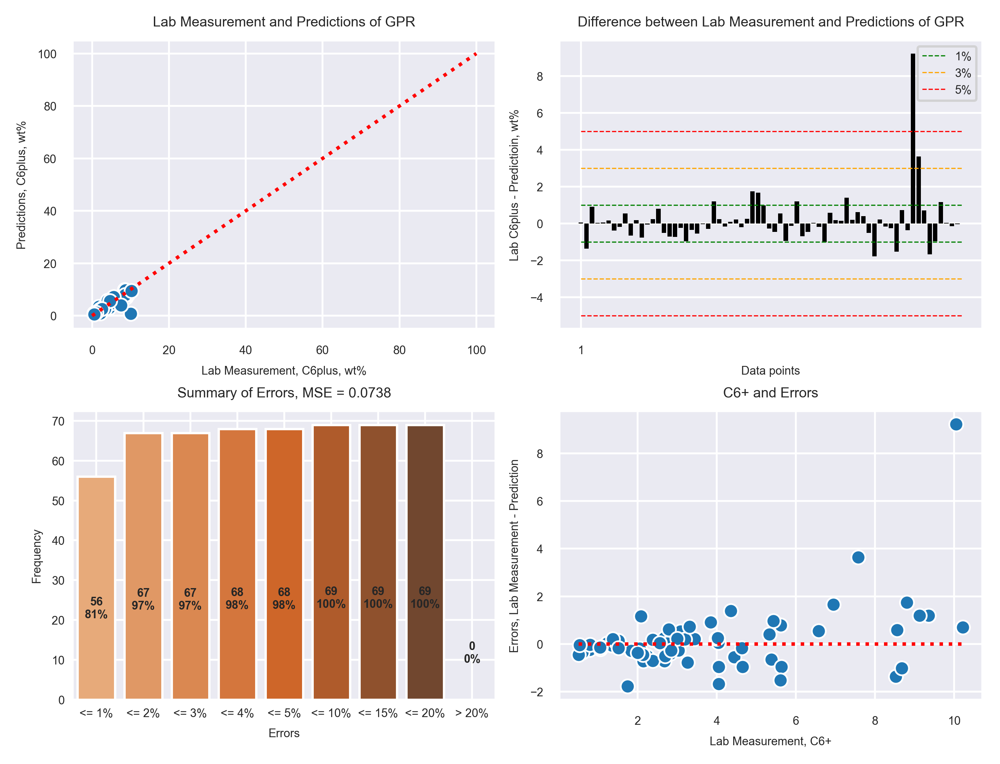

In [83]:
g_bp0 = {'alpha': 0.03699093946940535, 'kernel': RBF(length_scale=81.2)}

gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
g_pred0 = gpr0.fit(x_tr0, np.log1p(y_tr0.C6plus_mol)).predict(x_va0)
plot_pred(g_pred0, np.log1p(y_va0.C6plus_mol), 'GPR', mean_squared_error(g_pred0, np.log1p(y_va0.C6plus_mol)))

In [82]:
np.expm1(gpr0.predict(np.log1p(nx_test2)))

array([0.08022602])

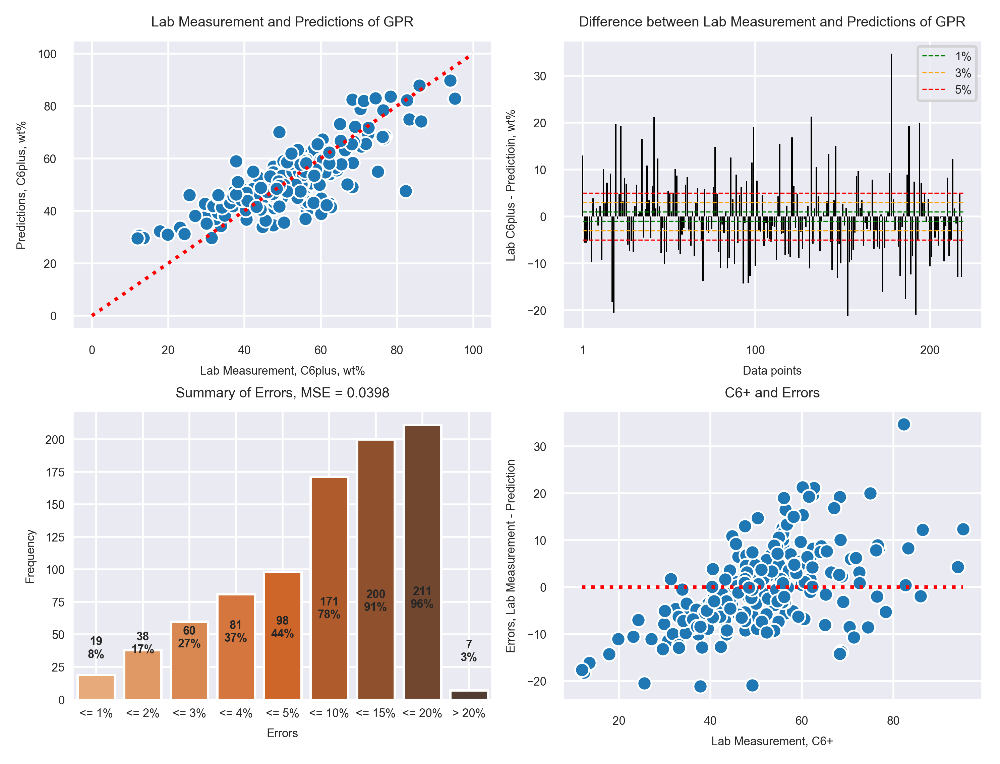

In [30]:
gpr1 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp1))
g_pred1 = gpr1.fit(x_tr1, np.log1p(y_tr1.C6plus_mol)).predict(x_va1)
plot_pred(g_pred1, np.log1p(y_va1.C6plus_mol), 'GPR', mean_squared_error(g_pred1, np.log1p(y_va1.C6plus_mol)))

# gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
# g_pred0 = gpr0.fit(x_tr0, y_tr0).predict(x_tr0)
# plot_pred(g_pred0, y_tr0, 'GPR', mean_squared_error(g_pred0, y_tr0))

# gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
# g_pred0 = gpr0.fit(x_tr0, y_tr0).predict(x_va0)
# plot_pred(g_pred0, y_va0, 'GPR', mean_squared_error(g_pred0, y_va0))

# gpr0 = make_pipeline(RobustScaler(), GaussianProcessRegressor(**g_bp0))
# g_pred0_2 = gpr0.fit(x_tr0, y_tr0).predict(X_test)
# # plot_pred(g_pred0, y_va0, 'GPR', mean_squared_error(g_pred0, y_va0))

#### SVR

In [21]:
# # Cluster1, subcluster1
# y = np.log1p(y_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)].C6plus_mol)
# x = x_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)]

# gpr_t = BaseModels(SVR, x, pd.DataFrame(y), x, pd.DataFrame(y), 5)
# # g_par = {
# #     'length': hp.uniform('length', 1e-10, 100),
# #     'alpha': hp.uniform('alpha', 0,100)
# #         }
# g_bp1, _, _ = gpr_t.tuningSVR(500)
# # g_bp1['kernel'] = RBF(length_scale=g_bp1['length'])
# g_bp1['kernel'] = 'rbf'
# # g_bp1.pop('length', None)

# gpr1 = make_pipeline(RobustScaler(), SVR(**g_bp1))
# g_pred1 = gpr1.fit(x, y).predict(x)
# plot_pred(g_pred1, y, 'GPR', mean_squared_error(g_pred1, y))

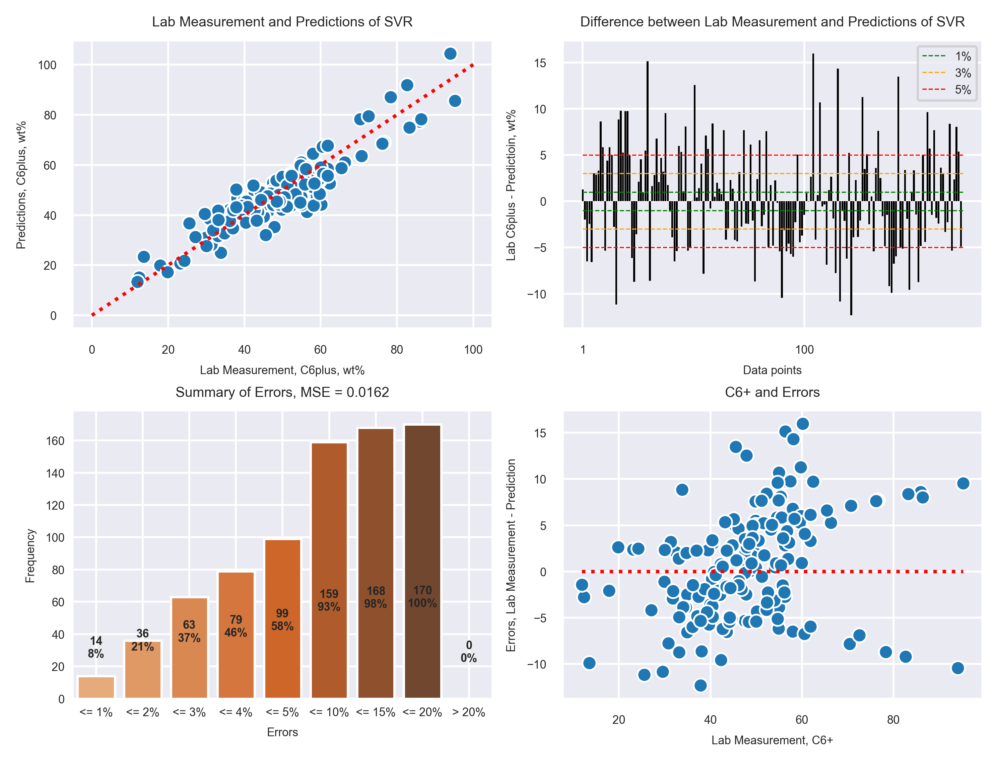

In [22]:
s_bp1 = {'C': 206.01687063420073,
 'epsilon': 0.1042631533140673,
 'gamma': 0.028570819580189782,
 'kernel': 'rbf'}
# Cluster1, subcluster1, validation
y = np.log1p(y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 1)].C6plus_mol)
x = x_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 1)]

gpr1 = make_pipeline(RobustScaler(), SVR(**s_bp1))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'SVR', mean_squared_error(g_pred1, y))

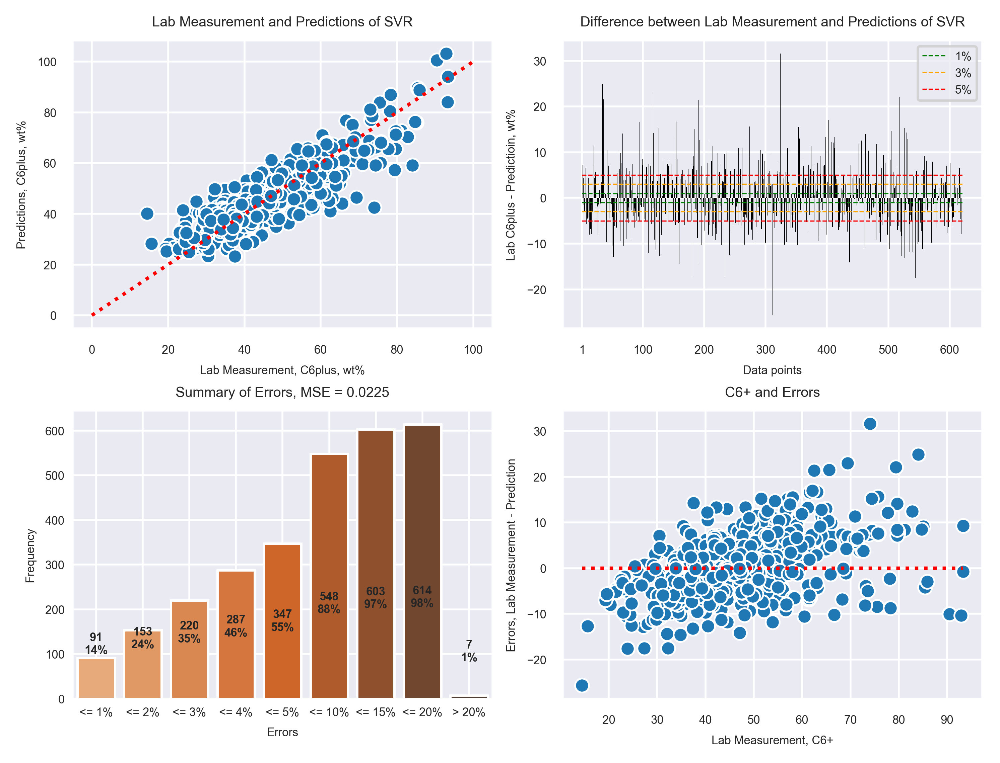

In [24]:
# Cluster1, subcluster1, training
y = np.log1p(y_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)].C6plus_mol)
x = x_tr1[(y_tr1.Labels == 1)&(y_tr1.Labels2 == 1)]

gpr1 = make_pipeline(RobustScaler(), SVR(**s_bp1))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'SVR', mean_squared_error(g_pred1, y))

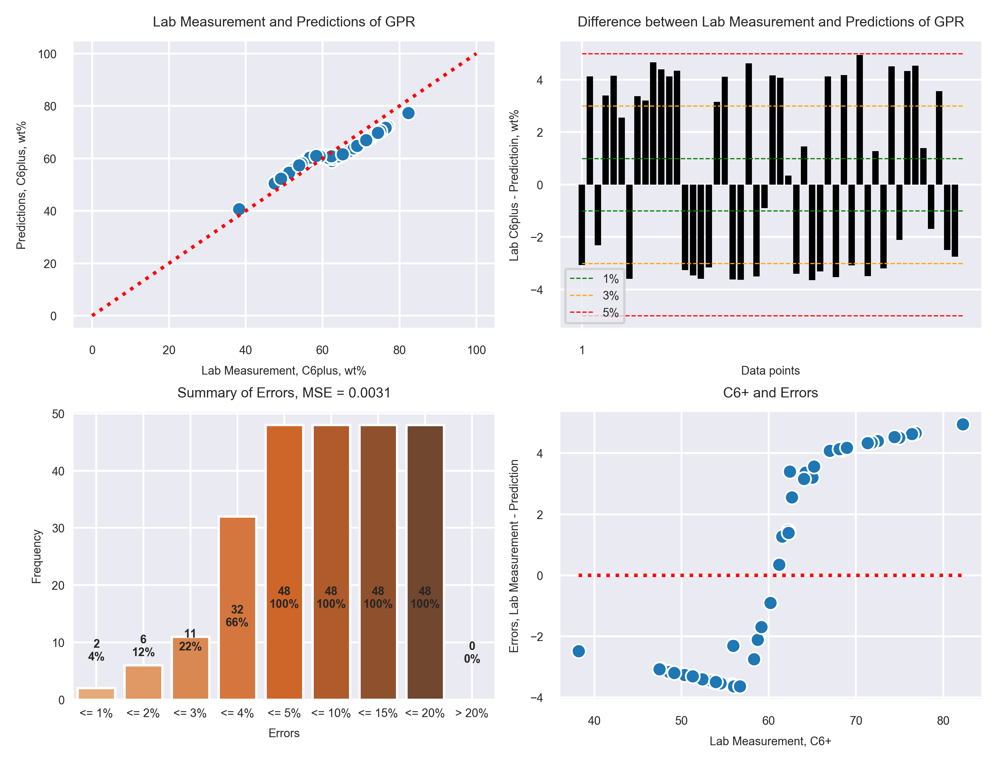

In [70]:
s_bp2 = {'C': 54.2751293121201,
 'epsilon': 0.061519437269968086,
 'gamma': 18.020982612596974,
 'kernel': 'rbf'}
# Cluster1, subcluster2
y = np.log1p(y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)].C6plus_mol)
x = x_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)]

gpr1 = make_pipeline(RobustScaler(), SVR(**s_bp2))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'GPR', mean_squared_error(g_pred1, y))

In [71]:
np.expm1(gpr1.predict(nx_test2))

array([60.851723])

In [42]:
y_t = y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)]

In [43]:
y_t.head()

,C6plus_mol,GOR_scf_stb,Labels,Labels2
451,47.535717,421.961635,1,2
95,68.409897,158.343000,1,2
435,55.893722,415.925510,1,2
216,62.418527,247.778720,1,2
237,68.269555,267.602028,1,2


In [46]:
test = BaseModels(SVR, pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb)), pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb)), 5)
t_bp, _, _ = test.tuningSVR(1000)

100%|███████████████████████████████████████████████| 1000/1000 [00:32<00:00, 31.20it/s, best loss: 0.2025638599919335]


C:\Users\YWu42\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


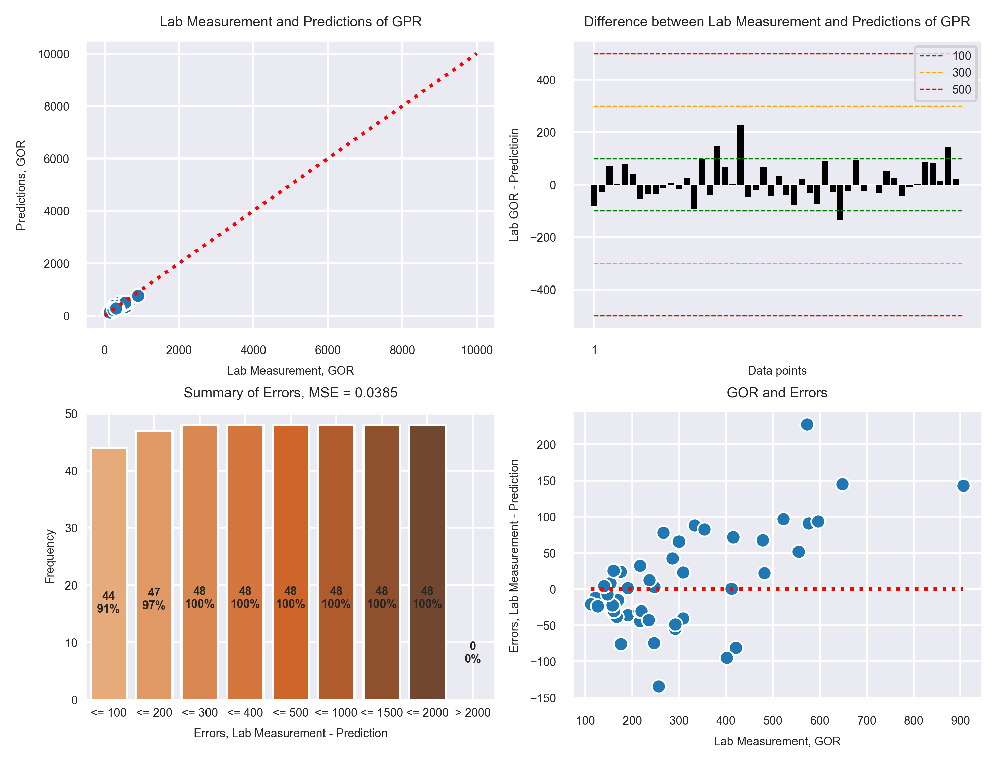

In [49]:
gpr1 = make_pipeline(RobustScaler(), SVR(**t_bp))
g_pred1 = gpr1.fit(pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb))).predict(pd.DataFrame(np.log1p(y_t.C6plus_mol)))
plot_pred2(g_pred1, np.log(y_t.GOR_scf_stb), 'GPR', mean_squared_error(g_pred1, np.log(y_t.GOR_scf_stb)))

C:\Users\YWu42\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


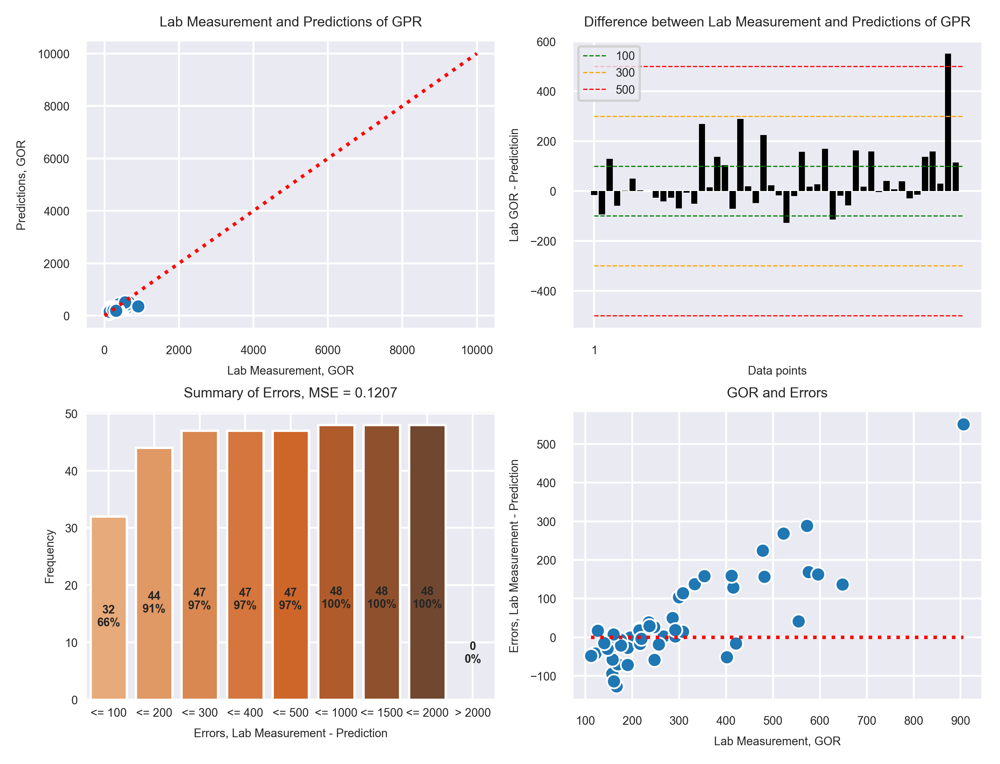

In [52]:
g_pred2 = gpr1.fit(pd.DataFrame(np.log1p(y_t.C6plus_mol)), pd.DataFrame(np.log(y_t.GOR_scf_stb))).predict(pd.DataFrame((g_pred1)))
plot_pred2(g_pred2, np.log(y_t.GOR_scf_stb), 'GPR', mean_squared_error(g_pred2, np.log(y_t.GOR_scf_stb)))

In [92]:
# Linear model
p_spa = {
            'C': hp.uniform('C', 0, 1000),
            'kernel': hp.choice('kernel', ['linear']),
            'epsilon': hp.uniform('epsilon', 0, 1)
        }
l_svr = BaseModels(SVR, x_tr0, pd.DataFrame(np.log1p(y_tr0.C6plus_mol)), x_tr0, pd.DataFrame(np.log1p(y_tr0.C6plus_mol)), 5)
# x_tr0, np.log1p(y_tr0.C6plus_mol)).predict(x_va0)
l_svr.tuning(p_spa, 500)

100%|█████████████████████████████████████████████████| 500/500 [02:00<00:00,  3.61it/s, best loss: 0.2854402496660101]


({'C': 437.33912616689975, 'epsilon': 0.17814372345683707, 'kernel': 0},
 0.2854402496660101,
 [{'state': 2,
   'tid': 0,
   'spec': None,
   'result': {'loss': 0.2931327423923955, 'status': 'ok'},
   'misc': {'tid': 0,
    'cmd': ('domain_attachment', 'FMinIter_Domain'),
    'workdir': None,
    'idxs': {'C': [0], 'epsilon': [0], 'kernel': [0]},
    'vals': {'C': [645.9518144537735],
     'epsilon': [0.4950292052312899],
     'kernel': [0]}},
   'exp_key': None,
   'owner': None,
   'version': 0,
   'book_time': datetime.datetime(2019, 5, 7, 14, 37, 43, 404000),
   'refresh_time': datetime.datetime(2019, 5, 7, 14, 37, 43, 484000)},
  {'state': 2,
   'tid': 1,
   'spec': None,
   'result': {'loss': 0.43718829656505315, 'status': 'ok'},
   'misc': {'tid': 1,
    'cmd': ('domain_attachment', 'FMinIter_Domain'),
    'workdir': None,
    'idxs': {'C': [1], 'epsilon': [1], 'kernel': [1]},
    'vals': {'C': [869.5419475856938],
     'epsilon': [0.8695367405818851],
     'kernel': [0]}},
   '

In [98]:
l_svr2 = make_pipeline(RobustScaler(), SVR(**{'C': 437.33912616689975, 'epsilon': 0.17814372345683707, 'kernel': 'linear'}))
t = l_svr2.fit(x_tr0, pd.DataFrame(np.log1p(y_tr0.C6plus_mol))).predict(np.log1p(nx_test2))

C:\Users\YWu42\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [99]:
np.expm1(t)

array([9.12660683])

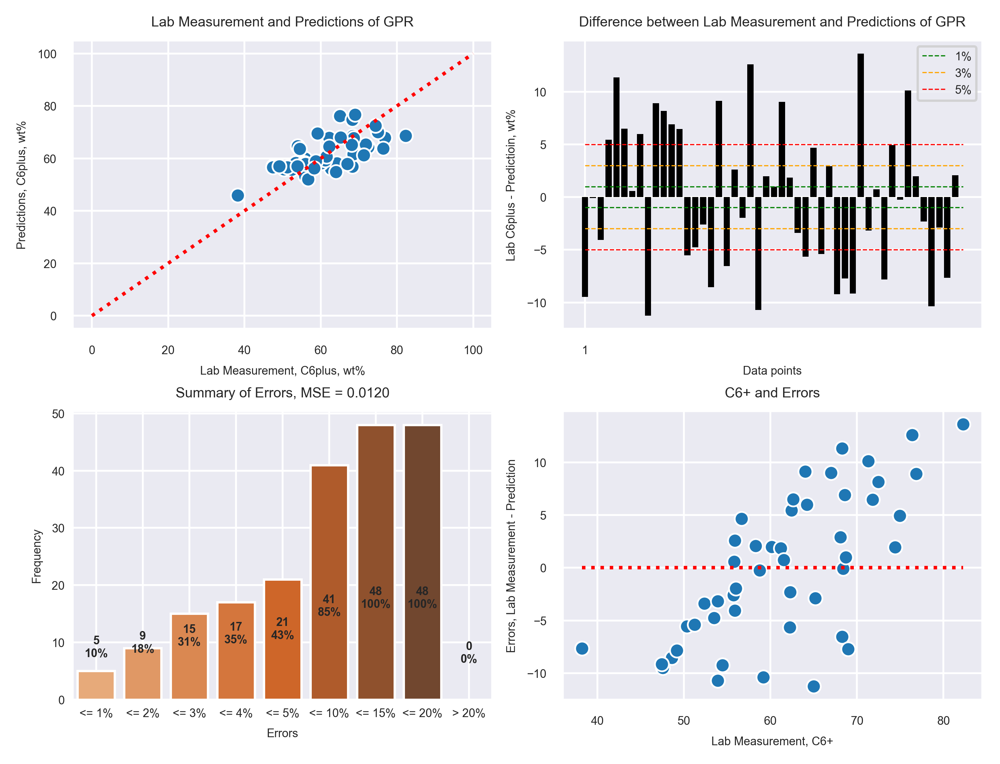

In [100]:
y = np.log1p(y_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)].C6plus_mol)
x = x_va1[(y_va1.Labels == 1)&(y_va1.Labels2 == 2)]

gpr1 = make_pipeline(RobustScaler(), SVR(**{'C': 437.33912616689975, 'epsilon': 0.17814372345683707, 'kernel': 'linear'}))
g_pred1 = gpr1.fit(x, y).predict(x)
plot_pred(g_pred1, y, 'GPR', mean_squared_error(g_pred1, y))

# 9. Final workflow

## First classification, cluster GC

In [10]:
def get1stclassData(lab):
    x_tr0, y_tr0, x_va0, y_va0 = X_train[y_train.Labels == lab], y_train[y_train.Labels == lab], X_val[y_val.Labels == lab], y_val[y_val.Labels == lab]
    return x_tr0, y_tr0, x_va0, y_va0
def get2ndclassData(lab):
    x_tr1_sub1, y_tr1_sub1, x_val1_sub1, y_va1_sub1 = x_tr1[y_tr1.Labels2 == lab], y_tr1[y_tr1.Labels2 == lab], x_va1[y_va1.Labels2 == lab], y_va1[y_va1.Labels2 == lab]
    return x_tr1_sub1, y_tr1_sub1, x_val1_sub1, y_va1_sub1

#### 1st classification

In [12]:
# # Randomforest for 1st classification
# C_rf = BaseModels(SVC, X_train, y_train.Labels, X_train, y_train.Labels, 5)
# par_spa = {
# #         'n_estimators': scope.int(hp.uniform('n_estimators', 1, 1000)),
# #         'max_depth': hp.choice('kernel', ['rbf']),
# #         'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
#         'C': hp.uniform('C', 0, 1000),
#         'kernel': hp.choice('kernel', ['rbf']),
#         'gamma': hp.uniform('gamma', 0, 1000),
# }
# a3, _, _ = C_rf.tuning(par_spa, 1000)
# a3

100%|██████████████████████████████████████████████| 1000/1000 [03:50<00:00,  5.12it/s, best loss: 0.12209626185353831]


{'C': 241.93855228165347, 'gamma': 0.3829563626873958, 'kernel': 0}

In [15]:
## 1st classification
# a3 = {'C': 241.93855228165347, 'gamma': 0.3829563626873958, 'kernel': 'rbf'}
rf_clfbp = {'C': 18.01425825418445, 'gamma': 9.778811169089607, 'kernel': 'rbf'}
# rf_clfbp = {'C': 241.93855228165347, 'gamma': 0.3829563626873958, 'kernel': 'rbf'}
rf_clf1 = make_pipeline(StandardScaler(), SVC(**rf_clfbp, probability=True))
label_pred = rf_clf1.fit((X_train), y_train.Labels).predict((X_val))
print('The first classification accuracy is: %.2f%%'%(100*accuracy_score(label_pred, y_val.Labels)))

The first classification accuracy is: 97.91%


#### 1st regression, on data from cluster 0 (GC)

In [16]:
# First non-linear regression, RF, to predict C6+
x_tr0, y_tr0, x_va0, y_va0 = get1stclassData(0)
y_tr0_C6, y_va0_C6 = np.log1p(y_tr0.C6plus_mol), np.log1p(y_va0.C6plus_mol)

In [16]:
# ## Tuning the first RF regression model for C6+ prediction of cluster 0
# rf1 = BaseModels(SVR, x_tr0, pd.DataFrame(y_tr0_C6), x_va0, pd.DataFrame(y_va0_C6), 5)
# rf_regbp, _, _ = rf1.tuningSVR(1000)
# rf_regbp

100%|████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.77it/s, best loss: 0.23679400055161365]


{'C': 2.141491378883427,
 'epsilon': 0.06733586872787456,
 'gamma': 33.356181800792136,
 'kernel': 'rbf'}

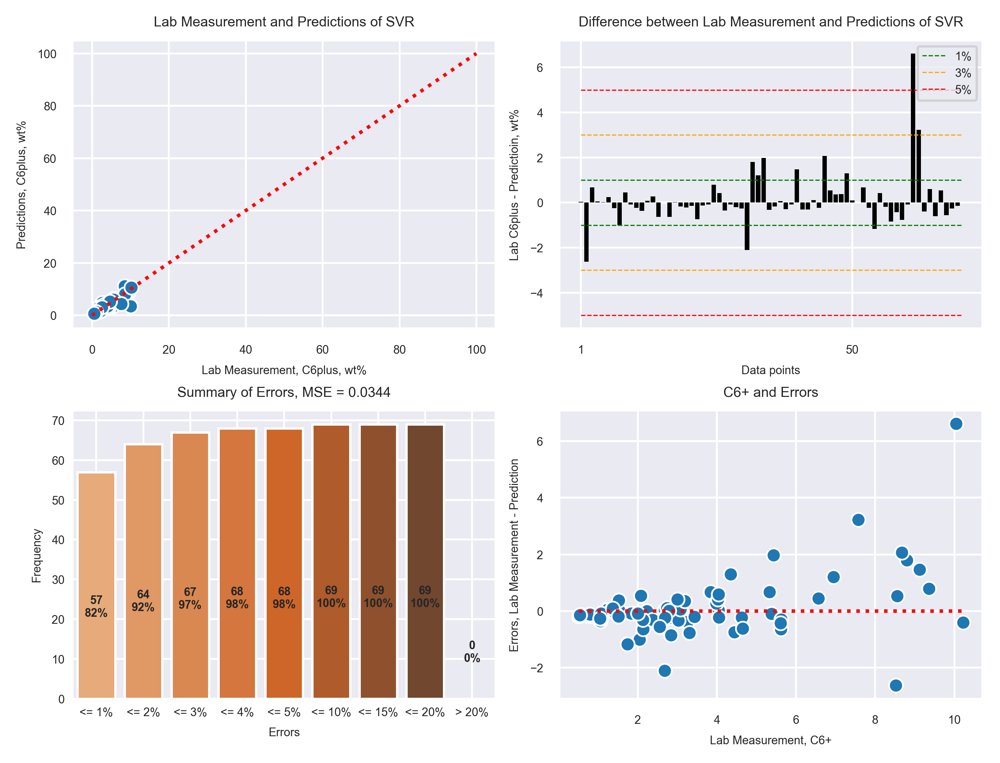

In [22]:
## Best parameters when 18% is the boundry
# rf_regbp = {'criterion': 'mae',
#     'max_depth': 16,
#     'max_features': 4,
#     'n_estimators': 700,
#     'n_jobs': -1,
#     'random_state': 42}
rf_regbp = {'C': 2.141491378883427,
 'epsilon': 0.06733586872787456,
 'gamma': 33.356181800792136,
 'kernel': 'rbf'}
rf_reg1 = make_pipeline(SVR(**rf_regbp)).fit(x_tr0, y_tr0_C6)
rf1_pred = rf_reg1.predict(x_va0)
plot_pred(rf1_pred, y_va0_C6, 'SVR', mean_squared_error(rf1_pred, y_va0_C6))

In [24]:
## Test on the 5 samples
# print('The predicted C6+ for the 5 samples are: ', np.expm1(rf_reg1.predict(X_test)))

## 2nd classification, on data from cluster 1 (Oils)

In [24]:
# Get the data of cluster 1
x_tr1, y_tr1, x_va1, y_va1 = get1stclassData(1)

In [26]:
# # Randomforest for 2nd classification
# # C_rf = BaseModels(RandomForestClassifier, x_tr1, y_tr1.Labels2, x_va1, y_va1.Labels2, 5)
# C_rf = BaseModels(SVC, x_tr1, y_tr1.Labels2, x_va1, y_va1.Labels2, 5)
# par_spa = {
# #         'n_estimators': scope.int(hp.uniform('n_estimators', 1, 1000)),
# #         'max_depth': hp.choice('kernel', ['rbf']),
# #         'max_depth': scope.int(hp.uniform('max_depth', 1, 30))
#         'C': hp.uniform('C', 0, 1000),
#         'kernel': hp.choice('kernel', ['rbf']),
#         'gamma': hp.uniform('gamma', 0, 1000),
# }
# a3, _, _ = C_rf.tuning(par_spa, 1000)
# a3

100%|██████████████████████████████████████████████| 1000/1000 [02:16<00:00,  7.03it/s, best loss: 0.31436849733533145]


{'C': 999.5532748629748, 'gamma': 0.9997476226162099, 'kernel': 0}

In [27]:
## 2nd classification
## max_depth:6, n_estimators:520 when 18 is the boundry
rf_clf2bp = {'C': 999.5532748629748, 'gamma': 0.9997476226162099, 'kernel': 'rbf'}
rf_clf2 = make_pipeline(StandardScaler(), SVC(**rf_clf2bp, probability=True))
label_pred2 = rf_clf2.fit((x_tr1), y_tr1.Labels2).predict((x_va1))
print('The second classification accuracy is: %.2f%%'%(100*accuracy_score(label_pred2, y_va1.Labels2)))

The second classification accuracy is: 88.99%


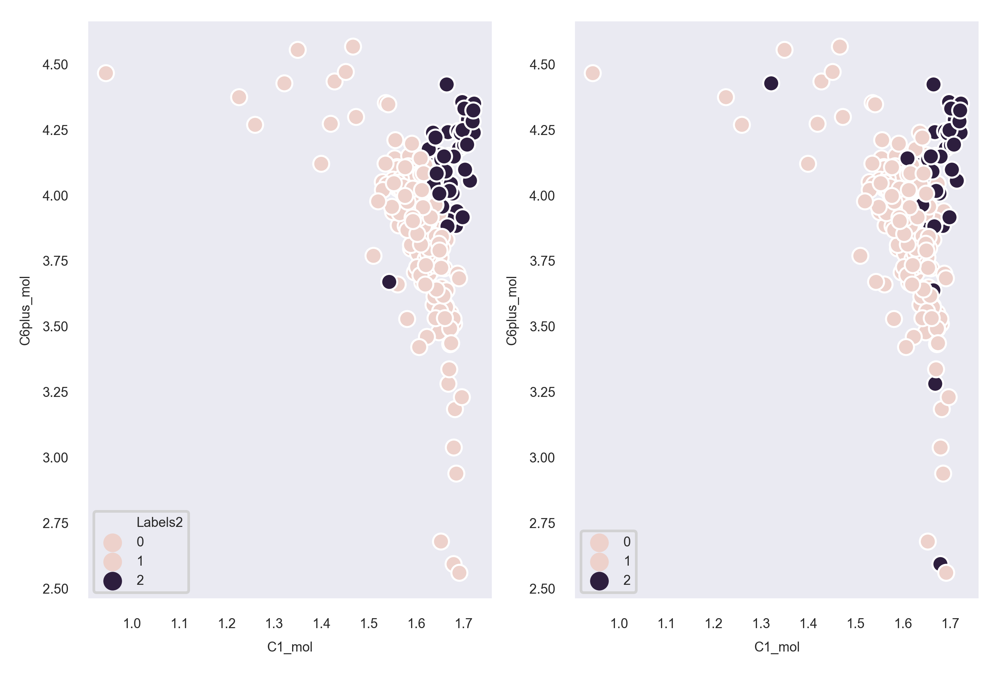

In [28]:
# plot the classificationi results of validation sets
plt.subplot(1,2,1)
sns.scatterplot(np.log1p(x_va1.C1_mol), np.log1p(y_va1.C6plus_mol), hue = y_va1.Labels2)
plt.subplot(1,2,2)
sns.scatterplot(np.log1p(x_va1.C1_mol), np.log1p(y_va1.C6plus_mol), hue = label_pred2)

##### 2nd classification, subset 1

In [29]:
x_tr1_sub1, y_tr1_sub1, x_val1_sub1, y_va1_sub1 = get2ndclassData(1)

In [31]:
# # ## Tuning the first RF regression model for C6+ prediction of cluster 1, subset 1
# rf1_1 = BaseModels(SVR, x_tr1_sub1, pd.DataFrame(np.log1p(y_tr1_sub1.C6plus_mol)), x_val1_sub1, pd.DataFrame(np.log1p(y_va1_sub1.C6plus_mol)), 5)
# rf_regbp1_1, _, _ = rf1_1.tuningSVR(500)
# rf_regbp1_1

100%|████████████████████████████████████████████████| 500/500 [01:30<00:00,  5.54it/s, best loss: 0.17590570792354956]


{'C': 521.4397037808724,
 'epsilon': 0.12981171519688284,
 'gamma': 0.3487088564682068,
 'kernel': 'rbf'}

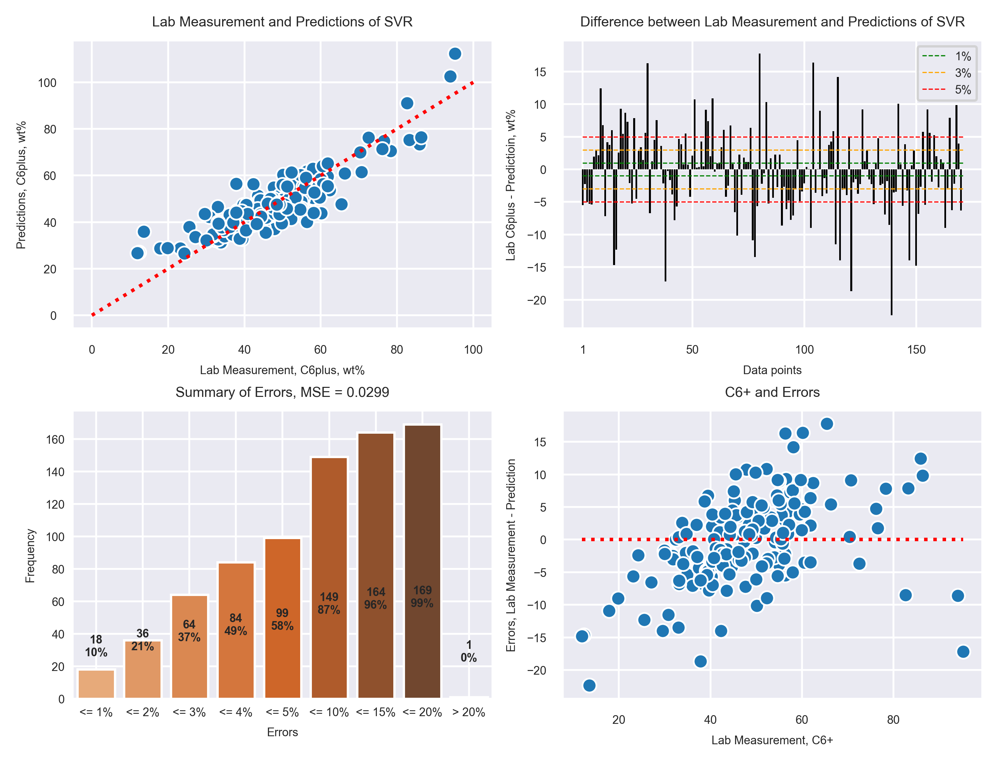

In [32]:
# rf_regbp1_1 = {'criterion': 'mae',
#  'max_depth': 6,
#  'max_features': 1,
#  'n_estimators': 10,
#  'n_jobs': -1,
#  'random_state': 42}
rf_regbp1_1 = {'C': 206.01687063420073,
 'epsilon': 0.1042631533140673,
 'gamma': 0.028570819580189782,
 'kernel': 'rbf'}
rf_reg1_1 = make_pipeline(SVR(**rf_regbp1_1)).fit(x_tr1_sub1, np.log1p(y_tr1_sub1.C6plus_mol))
rf1_pred1_1 = rf_reg1_1.predict(x_val1_sub1)
plot_pred(rf1_pred1_1, np.log1p(y_va1_sub1.C6plus_mol), 'SVR', mean_squared_error(rf1_pred1_1, np.log1p(y_va1_sub1.C6plus_mol)))

In [35]:
np.expm1(rf_reg1_1.predict(X_test))

array([28.64500277, 34.11200076, 32.68696394, 28.38301273, 28.40722535,
       28.33796442, 28.45398989, 25.53658504, 27.99419687, 28.07299567,
       28.09179779, 28.29368568, 28.39847056, 28.28758449, 27.38954313,
       27.35226628, 27.5920818 , 27.39358512, 33.36254083, 33.83016364,
       33.82371236, 33.79427954, 33.49519627, 34.00126578, 34.13385258,
       33.91837082, 33.98116337, 33.29495798, 33.87584989, 33.63132238,
       33.63132238, 33.69232943, 34.00126578, 33.71703677, 27.92012239,
       27.56501247, 27.82546909, 27.75111238, 26.96582143, 26.91972798,
       26.86861538, 27.37726473, 27.46937303, 27.32686923, 29.49987707,
       29.1908533 , 26.88360695, 34.1654427 , 33.96673396, 33.90116635,
       34.60464232, 33.88810682, 26.58259568, 34.46835725, 34.11578469,
       34.47758795, 34.69248476, 34.02830498, 33.43184402, 38.86348031,
       38.84467829, 39.03319975, 34.46835725, 34.11578469, 34.47758795,
       34.69248476, 34.02830498, 34.1654427 , 33.96673396, 33.90

##### 2nd classification, subset 2

In [35]:
x_tr1_sub2, y_tr1_sub2, x_val1_sub2, y_va1_sub2 = get2ndclassData(2)

In [46]:
# # ## Tuning the first RF regression model for C6+ prediction of cluster 1, subset 1
# rf1_2 = BaseModels(SVR, x_tr1_sub2, pd.DataFrame(np.log1p(y_tr1_sub2.C6plus_mol)), x_val1_sub2, pd.DataFrame(np.log1p(y_va1_sub2.C6plus_mol)), 5)
# rf_regbp1_2, _, _ = rf1_2.tuningSVR(500)
# rf_regbp1_2

100%|████████████████████████████████████████████████| 500/500 [00:14<00:00, 34.82it/s, best loss: 0.11713680575225012]


{'C': 522.3923483262837,
 'epsilon': 0.06334679375815835,
 'gamma': 18.130503726196004,
 'kernel': 'rbf'}

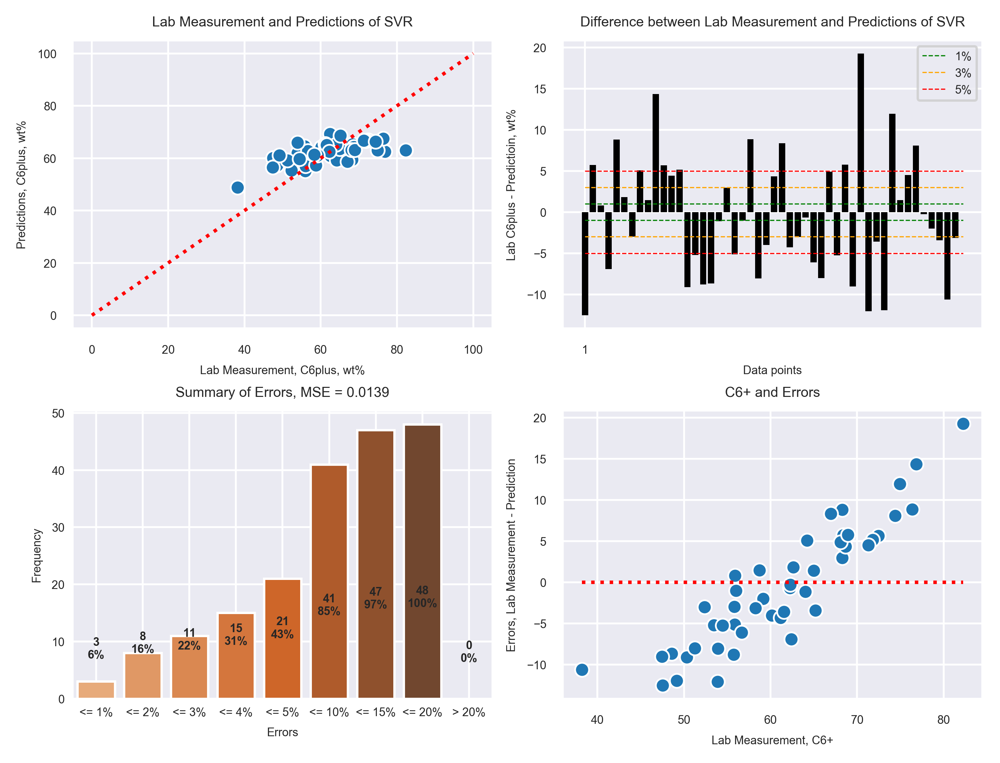

In [36]:
# rf_regbp1_1 = {'criterion': 'mae',
#  'max_depth': 6,
#  'max_features': 1,
#  'n_estimators': 10,
#  'n_jobs': -1,
#  'random_state': 42}
# rf_regbp1_2 = {'C': 54.2751293121201,
#  'epsilon': 0.061519437269968086,
#  'gamma': 18.020982612596974,
#  'kernel': 'rbf'}
rf_regbp1_2 = {'C': 522.3923483262837,
 'epsilon': 0.06334679375815835,
 'gamma': 18.130503726196004,
 'kernel': 'rbf'}
rf_reg1_2 = SVR(**rf_regbp1_2).fit(x_tr1_sub2, np.log1p(y_tr1_sub2.C6plus_mol))
rf1_pred1_2 = rf_reg1_2.predict(x_val1_sub2)
plot_pred(rf1_pred1_2, np.log1p(y_va1_sub2.C6plus_mol), 'SVR', mean_squared_error(rf1_pred1_2, np.log1p(y_va1_sub2.C6plus_mol)))

In [48]:
np.expm1(rf_reg1_2.predict(X_test))

array([57.65317152, 63.42612112, 61.44409674, 60.87593806, 60.98126942,
       60.96145304, 61.13174604, 62.99025825, 60.79939581, 60.77175751,
       60.70451452, 61.37265122, 61.41987487, 61.3817814 , 61.6898296 ,
       61.81556185, 60.97998104, 61.62297187, 62.96719291, 62.95513677,
       62.9550284 , 62.95192911, 62.96290145, 62.93567027, 62.25676663,
       62.59503075, 62.92161583, 62.96416213, 62.9246904 , 62.95334672,
       62.95334672, 62.95392466, 62.93567027, 62.9471563 , 62.1575031 ,
       62.14813977, 61.36764064, 61.8100059 , 62.92032135, 62.83489092,
       62.96632366, 62.7694354 , 62.24302411, 62.49258547, 61.18117728,
       61.36792498, 61.11195464, 63.35281434, 63.0763821 , 63.01969316,
       64.19176534, 63.01327894, 62.99991207, 63.71104223, 63.42775074,
       63.55220418, 64.10278408, 63.4227749 , 61.3864437 , 67.85627071,
       67.96480207, 66.79592585, 63.71104223, 63.42775074, 63.55220418,
       64.10278408, 63.4227749 , 63.35281434, 63.0763821 , 63.01

### weighted predictions

In [37]:
def weighted_pre(X_test):
    X_test2 = copy.copy(X_test)
    X_test2['C0_pro'] = rf_clf1.predict_proba(X_test)[:,0]

    fir_pro = rf_clf1.predict_proba(X_test)[:,1]

    sec_pro = rf_clf2.predict_proba(X_test)
    X_test2['C1_pro'] = fir_pro*sec_pro[:,0]
    X_test2['C2_pro'] = fir_pro*sec_pro[:,1]
    X_test2['Weighted_predictions'] = np.expm1(X_test2['C0_pro']*rf_reg1.predict(X_test) + X_test2['C1_pro']*rf_reg1_1.predict(X_test) + X_test2['C2_pro']*rf_reg1_2.predict(X_test))
    X_test3 = pd.concat((np.expm1(X_test[['C1_mol', 'C2_mol', 'C3_mol', 'C4_mol', 'C5_mol']]), X_test2[['C0_pro', 'C1_pro', 'C2_pro', 'Weighted_predictions']]), axis = 1)
    return X_test3

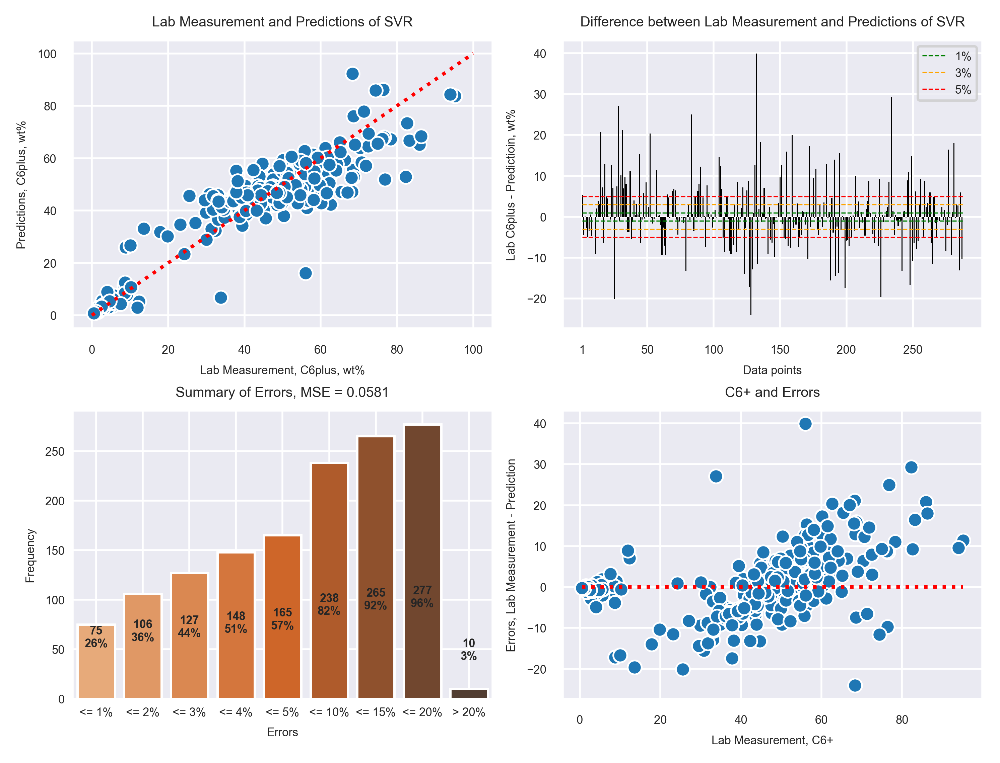

In [46]:
t2 = np.log1p(weighted_pre(X_val).Weighted_predictions)
plot_pred(t2, (y_valC6_log), 'SVR', mean_squared_error(t2, (y_valC6_log)))

In [38]:
weighted_pre(X_test)

,C1_mol,C2_mol,C3_mol,C4_mol,C5_mol,C0_pro,C1_pro,C2_pro,Weighted_predictions
0,75.923690,9.695726,7.196329,4.636561,2.547694,0.997775,0.000905,1.319712e-03,4.967417
1,68.059641,12.405469,9.543348,6.129509,3.862032,0.006549,0.985842,7.609180e-03,33.800012
2,69.683093,12.160045,9.061426,5.679789,3.415647,0.021846,0.976699,1.455275e-03,31.280206
3,79.598447,10.354690,5.138867,3.027727,1.880269,0.459305,0.527843,1.285204e-02,12.651700
4,79.502805,10.384784,5.173926,3.042264,1.896221,0.371161,0.612601,1.623870e-02,14.755681
5,79.529696,10.357040,5.180245,3.052952,1.880067,0.436742,0.548739,1.451818e-02,13.114846
6,79.352506,10.417002,5.226922,3.091252,1.912317,0.270979,0.708624,2.039695e-02,17.654714
7,80.689066,10.561856,5.272151,1.551803,1.925125,0.067527,0.864482,6.799058e-02,24.062010
8,80.303762,10.175903,4.921253,2.874847,1.724235,0.989849,0.010019,1.320113e-04,5.084345
9,80.300853,10.190840,4.903458,2.870454,1.734396,0.989674,0.010192,1.340435e-04,5.084549


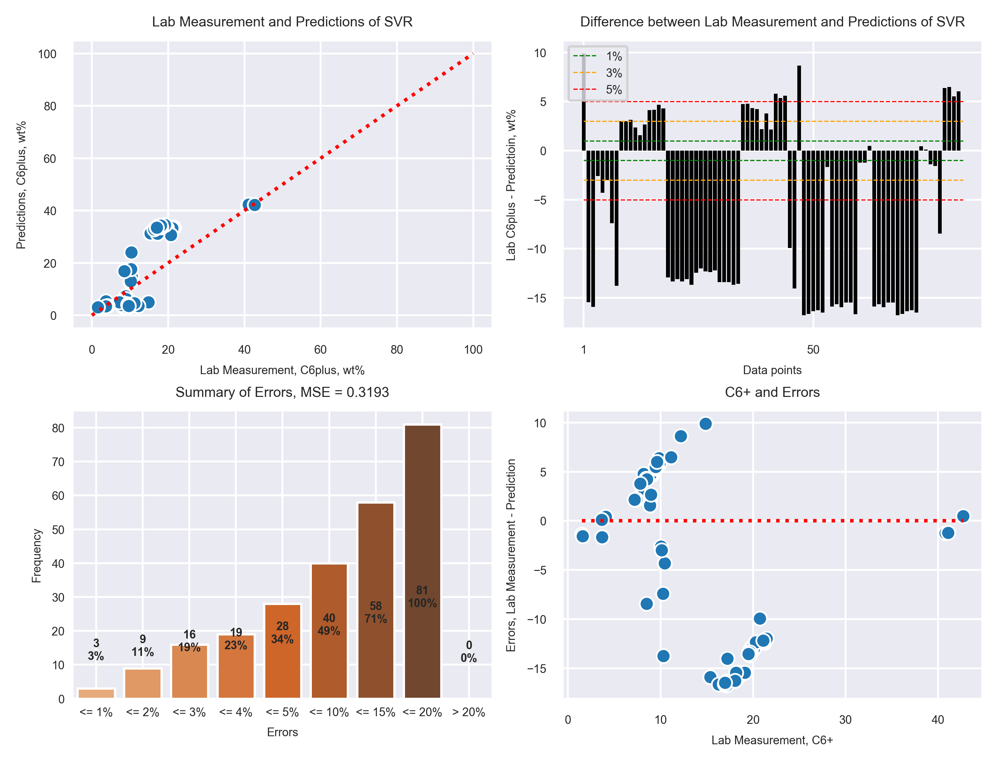

In [47]:
t = np.log1p(weighted_pre(X_test).Weighted_predictions)
plot_pred(t, np.log1p(test_features.C6plus_mol), 'SVR', mean_squared_error(t, np.log1p(test_features.C6plus_mol)))